# Описание задачи

Провести анализ ценообразования автомобилей на вторичном рынке. Определить какие характеристики лота влияют на итоговую цену автомобиля. 

**Цель работы:** разраразработать модель для предсказания стоимости продажи автомобиля на вторичном рынке. Работа модели будет оцениваться по метрике MAPE (Mean Absolute Percentage Error).



**Дополнительно:** 
- создать web-приложения прототип вашей модели, используя библиотеку Streamlit;
- подготовить отчет по исследованию.

# Описание данных

Проект включает в себя два датасета:
- train.csv - информация о характеристиках автомобилей (~440000);
- test.csv - информация о характеристиках автомобилей (~110000).

Описание полей данных:

- `Date`: Год выпуска автомобиля.
- `Make`: Марка автомобиля.
- `Model`: издание автомобиля определенной марки.
- `Trim`: Уровни отделки салона автомобиля — это просто разные версии модели.
- `Body`: Тип кузова транспортного средства относится к форме и модели конкретной марки автомобиля.
- `Transmission`: механизм, который передает мощность от двигателя к колесам.
- `VIN`: идентификационный номер транспортного средства.
- `State`: штат.
- `Condition`: Состояние автомобилей на момент аукциона.
- `Odometer`: расстояние, пройденное автомобилем с момента выпуска.
- `Color`: Цвет кузова автомобиля.
- `Interior`: Цвет салона автомобиля.
- `Seller`: Продавец автомобиля, автосалоны.
- нет в данных`mmr`: Рекорд рынка Manhiem, рыночная оценочная цена автомобилей.
- `sellingprice`: *целевой признак* - цена, по которой автомобиль был продан на аукционе.
- `saledate`: Дата продажи автомобиля.

# Импорты

In [1]:
# pip install vininfo

In [2]:
# pip install pandas_profiling

In [3]:
# pip install scikit-learn --upgrade

In [4]:
# pip install python-Levenshtein

In [5]:
# pip install fuzzywuzzy

In [6]:
import pandas as pd
import numpy as np
import re

from Levenshtein import distance as lev
from fuzzywuzzy import fuzz
from fuzzywuzzy import process

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import (train_test_split,
                                     cross_val_score, 
                                     GridSearchCV,
                                     StratifiedKFold)
from sklearn.preprocessing import (OneHotEncoder,
                                   OrdinalEncoder,
                                   StandardScaler,
                                   PolynomialFeatures)
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (accuracy_score, 
                             f1_score, 
                             mean_absolute_percentage_error,
                             make_scorer,
                             confusion_matrix, 
                             roc_curve, 
                             roc_auc_score, 
                             recall_score,
                             precision_recall_curve)
from sklearn.utils.class_weight import compute_class_weight

import phik
from phik.report import plot_correlation_matrix

from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor, Pool

from vininfo import Vin

import pandas_profiling

import warnings
from tqdm import tqdm

/var/folders/z4/6j47m_z91tj4frx0v8hk5ds40000gn/T/ipykernel_5450/2872032948.py:43: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [7]:
warnings.filterwarnings('ignore')

In [8]:
RANDOM_STATE = 42

# Предобработка данных

In [9]:
data = pd.read_csv('train.csv')
data.head()

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate
0,2011,Ford,Edge,SEL,suv,automatic,2fmdk3jc4bba41556,md,4.2,111041.0,black,black,santander consumer,12500,Tue Jun 02 2015 02:30:00 GMT-0700 (PDT)
1,2014,Ford,Fusion,SE,Sedan,automatic,3fa6p0h75er208976,mo,3.5,31034.0,black,black,ars/avis budget group,14500,Wed Feb 25 2015 02:00:00 GMT-0800 (PST)
2,2012,Nissan,Sentra,2.0 SL,sedan,automatic,3n1ab6ap4cl698412,nj,2.2,35619.0,black,black,nissan-infiniti lt,9100,Wed Jun 10 2015 02:30:00 GMT-0700 (PDT)
3,2003,HUMMER,H2,Base,suv,automatic,5grgn23u93h101360,tx,2.8,131301.0,gold,beige,wichita falls ford lin inc,13300,Wed Jun 17 2015 03:00:00 GMT-0700 (PDT)
4,2007,Ford,Fusion,SEL,Sedan,automatic,3fahp08z17r268380,md,2.0,127709.0,black,black,purple heart,1300,Tue Feb 03 2015 04:00:00 GMT-0800 (PST)


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440236 entries, 0 to 440235
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          440236 non-null  int64  
 1   make          432193 non-null  object 
 2   model         432113 non-null  object 
 3   trim          431899 non-null  object 
 4   body          429843 non-null  object 
 5   transmission  388775 non-null  object 
 6   vin           440236 non-null  object 
 7   state         440236 non-null  object 
 8   condition     430831 non-null  float64
 9   odometer      440167 non-null  float64
 10  color         439650 non-null  object 
 11  interior      439650 non-null  object 
 12  seller        440236 non-null  object 
 13  sellingprice  440236 non-null  int64  
 14  saledate      440236 non-null  object 
dtypes: float64(2), int64(2), object(11)
memory usage: 50.4+ MB


## Предобработка `data`

Количество пропущенных значений:

In [11]:
data.isna().sum()

year                0
make             8043
model            8123
trim             8337
body            10393
transmission    51461
vin                 0
state               0
condition        9405
odometer           69
color             586
interior          586
seller              0
sellingprice        0
saledate            0
dtype: int64

Пропуски содержатся в следующих признаках:
- `make`;
- `model`;
- `trim`;
- `body`;
- `transmission`;
- `condition`;
- `odometer`;
- `color`;
- `interior`.

### Признаки `make` and `model`

Так как в ячейках, где пропущены марки, так же пропущены и модели, что ровным счетом обнудяет всю полученную информацию о лоте, удалим все строки с пропущенными моделями  

In [12]:
data.loc[data['make'].isna(), 'make'] = data.loc[data['make'].isna(), 'vin'].apply(lambda x: Vin(x).annotate()['Manufacturer'])

Добавим страну и регион из VIN:

In [13]:
data['county'] = data['vin'].apply(lambda x: Vin(x).annotate()['Country'])
data['region'] = data['vin'].apply(lambda x: Vin(x).annotate()['Region'])

In [14]:
data.head(2)

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,sellingprice,saledate,county,region
0,2011,Ford,Edge,SEL,suv,automatic,2fmdk3jc4bba41556,md,4.2,111041.0,black,black,santander consumer,12500,Tue Jun 02 2015 02:30:00 GMT-0700 (PDT),Canada,North America
1,2014,Ford,Fusion,SE,Sedan,automatic,3fa6p0h75er208976,mo,3.5,31034.0,black,black,ars/avis budget group,14500,Wed Feb 25 2015 02:00:00 GMT-0800 (PST),Mexico,North America


Заполним пропуски в столбце `model` значением `mu` - *model unknown*:

In [15]:
data.loc[data['model'].isna(), 'model'] = data.loc[data['model'].isna(), 'model'].fillna('mu')

In [16]:
data.isna().sum()

year                0
make                0
model               0
trim             8337
body            10393
transmission    51461
vin                 0
state               0
condition        9405
odometer           69
color             586
interior          586
seller              0
sellingprice        0
saledate            0
county              0
region              0
dtype: int64

**Вывод**: пропуски в столбцах `make` и `model` устранены. 

### Признак `transmission`

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440236 entries, 0 to 440235
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          440236 non-null  int64  
 1   make          440236 non-null  object 
 2   model         440236 non-null  object 
 3   trim          431899 non-null  object 
 4   body          429843 non-null  object 
 5   transmission  388775 non-null  object 
 6   vin           440236 non-null  object 
 7   state         440236 non-null  object 
 8   condition     430831 non-null  float64
 9   odometer      440167 non-null  float64
 10  color         439650 non-null  object 
 11  interior      439650 non-null  object 
 12  seller        440236 non-null  object 
 13  sellingprice  440236 non-null  int64  
 14  saledate      440236 non-null  object 
 15  county        440236 non-null  object 
 16  region        440236 non-null  object 
dtypes: float64(2), int64(2), object(13)
memory usage

In [18]:
trans_modes = data.groupby(by=['year', 'make', 'model'])['transmission'].apply(lambda x: pd.Series.mode(x)).reset_index()

In [19]:
data['transmission'].value_counts(dropna=False)

automatic    375061
NaN           51461
manual        13714
Name: transmission, dtype: int64

In [20]:
data = data.merge(trans_modes, on=['year', 'make', 'model'], how='left')

In [21]:
data['transmission_x'].value_counts(dropna=False)

automatic    375305
NaN           51506
manual        13958
Name: transmission_x, dtype: int64

In [22]:
trans_modes = data.groupby(by=['year', 'make'])['transmission_x'].apply(lambda x: pd.Series.mode(x)).reset_index()

In [23]:
trans_modes['transmission_x'].value_counts(dropna=False)

automatic    1169
manual         63
Name: transmission_x, dtype: int64

In [24]:
data = data.merge(trans_modes, on=['year', 'make'], how='left')

In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 441113 entries, 0 to 441112
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   year              441113 non-null  int64  
 1   make              441113 non-null  object 
 2   model             441113 non-null  object 
 3   trim              432679 non-null  object 
 4   body              430602 non-null  object 
 5   transmission_x_x  389573 non-null  object 
 6   vin               441113 non-null  object 
 7   state             441113 non-null  object 
 8   condition         431675 non-null  float64
 9   odometer          441043 non-null  float64
 10  color             440523 non-null  object 
 11  interior          440523 non-null  object 
 12  seller            441113 non-null  object 
 13  sellingprice      441113 non-null  int64  
 14  saledate          441113 non-null  object 
 15  county            441113 non-null  object 
 16  region            44

In [26]:
data['transmission_y'].value_counts(dropna=False)

automatic    437592
manual         3185
NaN             336
Name: transmission_y, dtype: int64

In [27]:
def get_tran(row):
    if pd.isna(row['transmission_y']):
        value = row['transmission_x_y']
    else: 
        value = row['transmission_y']

    return value

In [28]:
data['transmission'] = data.apply(get_tran, axis=1)

In [29]:
data = data.drop(columns=['transmission_y', 'transmission_x_y'])

In [30]:
data['transmission'].value_counts(dropna=False)

automatic    437762
manual         3188
NaN             163
Name: transmission, dtype: int64

In [31]:
trans_modes = data.groupby(by=['year'])['transmission_x_x'].apply(lambda x: pd.Series.mode(x)).reset_index()

In [32]:
data = data.merge(trans_modes, on=['year'], how='left')

In [33]:
def get_tran_one(row):
    if pd.isna(row['transmission']):
        value = row['transmission_x_x_y']
    else: 
        value = row['transmission']

    return value

In [34]:
data['transmission'] = data.apply(get_tran_one, axis=1)

In [35]:
data = data.drop(columns=['transmission_x_x_x', 'transmission_x_x_y', 'level_1', 'level_2', 'level_3'])

In [36]:
data['transmission'].value_counts(dropna=False)

automatic    437925
manual         3188
Name: transmission, dtype: int64

In [37]:
data.isna().sum()

year                0
make                0
model               0
trim             8434
body            10511
vin                 0
state               0
condition        9438
odometer           70
color             590
interior          590
seller              0
sellingprice        0
saledate            0
county              0
region              0
transmission        0
dtype: int64

### Признаки `trim`, `body`, `color`, `interior`

**Исследуем столбцы:**
- `trim` - заменим пропуски на `trim_u` - *trim unknown*;
- `body` - заменим пропуски на `body_u` - *body unknown*;
- `color` - заменим пропуски на `color_u` - *color unknown*;
- `interior` - заменим пропуски на `interior_u` - *interior unknown*;

In [38]:
data.loc[data['trim'].isna(), 'trim'] = data.loc[data['trim'].isna(), 'trim'].fillna('trim_u')
data.loc[data['body'].isna(), 'body'] = data.loc[data['body'].isna(), 'body'].fillna('body_u')
data.loc[data['color'].isna(), 'color'] = data.loc[data['color'].isna(), 'color'].fillna('color_u')
data.loc[data['interior'].isna(), 'interior'] = data.loc[data['interior'].isna(), 'interior'].fillna('interior_u')

### Признак `condition`

In [39]:
data['condition'].describe()

count    431675.000000
mean          3.424207
std           0.950251
min           1.000000
25%           2.700000
50%           3.600000
75%           4.200000
max           5.000000
Name: condition, dtype: float64

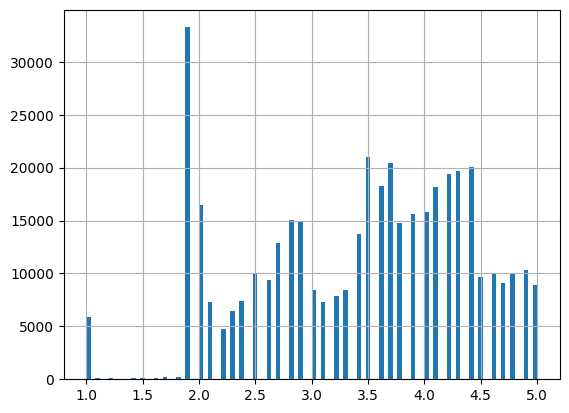

In [40]:
data['condition'].hist(bins=100)
plt.show()

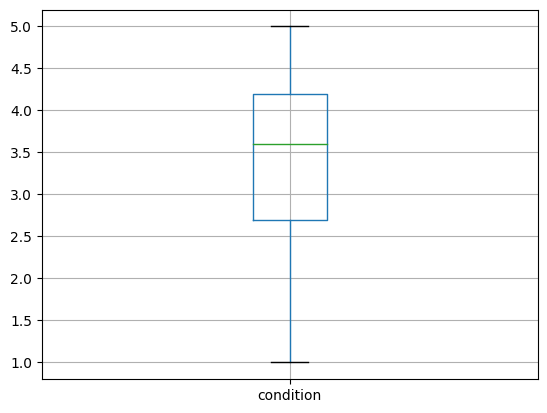

In [41]:
data.boxplot('condition')
plt.show()

Заменим состояние автомобиля медианным значением состояния автомобиля в группе по году и модели. 

In [42]:
cond_model = data.groupby(by=['year', 'make', 'model'])['condition'].agg('median').reset_index()
cond_make = data.groupby(by=['year', 'make'])['condition'].agg('median').reset_index()
cond_year = data.groupby(by=['year'])['condition'].agg('median').reset_index()    

In [43]:
data = data.merge(cond_model, on=['year', 'make', 'model'], how='left')

In [44]:
data = data.merge(cond_make, on=['year', 'make'], how='left')

In [45]:
data = data.merge(cond_year, on=['year'], how='left')

In [46]:
data.isna().sum()

year               0
make               0
model              0
trim               0
body               0
vin                0
state              0
condition_x     9438
odometer          70
color              0
interior           0
seller             0
sellingprice       0
saledate           0
county             0
region             0
transmission       0
condition_y      110
condition_x       38
condition_y        0
dtype: int64

In [47]:
data.columns = ['year', 'make', 'model', 'trim', 'body', 'vin', 'state', 'condition_x',
       'odometer', 'color', 'interior', 'seller', 'sellingprice', 'saledate', 'county',
       'region', 'transmission', 'condition_y', 'condition_x', 'condition']

In [48]:
data = data.drop(columns=['condition_x', 'condition_y'])

In [49]:
data.isna().sum()

year             0
make             0
model            0
trim             0
body             0
vin              0
state            0
odometer        70
color            0
interior         0
seller           0
sellingprice     0
saledate         0
county           0
region           0
transmission     0
condition        0
dtype: int64

**Вывод**: Все пропуски устранены. 

### Признак `odometer`

Заменим пробег автомобиля медианным значением пробега автомобиля в группе по году и модели. 

In [50]:
odom_model = data.groupby(by=['year', 'make', 'model'])['odometer'].agg('median').reset_index()

In [51]:
data = data.merge(odom_model, on=['year', 'make', 'model'], how='left')

In [52]:
odom_make = data.groupby(by=['year', 'make'])['odometer_x'].agg('median').reset_index()

In [53]:
data = data.merge(odom_make, on=['year', 'make'], how='left')

In [54]:
data = data.drop(columns=['odometer_x_x', 'odometer_y'])
data = data.rename(columns={'odometer_x_y': 'odometer'})

In [55]:
data.isna().sum()

year            0
make            0
model           0
trim            0
body            0
vin             0
state           0
color           0
interior        0
seller          0
sellingprice    0
saledate        0
county          0
region          0
transmission    0
condition       0
odometer        0
dtype: int64

In [56]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 441113 entries, 0 to 441112
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          441113 non-null  int64  
 1   make          441113 non-null  object 
 2   model         441113 non-null  object 
 3   trim          441113 non-null  object 
 4   body          441113 non-null  object 
 5   vin           441113 non-null  object 
 6   state         441113 non-null  object 
 7   color         441113 non-null  object 
 8   interior      441113 non-null  object 
 9   seller        441113 non-null  object 
 10  sellingprice  441113 non-null  int64  
 11  saledate      441113 non-null  object 
 12  county        441113 non-null  object 
 13  region        441113 non-null  object 
 14  transmission  441113 non-null  object 
 15  condition     441113 non-null  float64
 16  odometer      441113 non-null  float64
dtypes: float64(2), int64(2), object(13)
memory usage

**Вывод**: Все пропуски устранены. 

### Вывод

Датасет был наполнен пропущенными значениями в следующих признаках:
- `make` = 8043
- `model` = 8123
- `trim` = 8337
- `body` = 10393
- `condition` = 9405
- `odometer` = 69
- `color` = 586
- `interior` = 586

Пропуски в категориальных признаках `trim`, `body`, `color` и `interior` были заменнены на эквивалент, что признак неизвестен. 

Пропуски в категориальных признаках `make` и `model` были заменены значением из VIN и эквивалентом неизвестной модели.

Количественные признаки `condition` и `odometer` были заменены медианным значением по марке/модели авто, сгруппированному по году выпуска. 

Добавлены новые признаки `country` и `region` взятые из VIN. 

Все пропуски были обработаны. 

## Тип данных

Скорректировать тип данных надо только у одиного признака - `saledate`. Приведем его к читаемому виду `datestamp`

In [57]:
data['saledate'] = pd.to_datetime(data['saledate'], utc=True)

In [58]:
data['saledate'].dtype

datetime64[ns, UTC]

**Вывод**: тип даты корректный. 

## Проверка дубликатов

### Признак `vin`

In [59]:
data['vin'].duplicated().sum()

877

Найдено 877 дубликатов VIN. Удалим строки с повторяющимися значениями VIN:

Проверим категориальные признаки на неявные дубликаты:

In [60]:
data = data.drop_duplicates(subset=['vin']).reset_index(drop=True)

In [61]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440236 entries, 0 to 440235
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype              
---  ------        --------------   -----              
 0   year          440236 non-null  int64              
 1   make          440236 non-null  object             
 2   model         440236 non-null  object             
 3   trim          440236 non-null  object             
 4   body          440236 non-null  object             
 5   vin           440236 non-null  object             
 6   state         440236 non-null  object             
 7   color         440236 non-null  object             
 8   interior      440236 non-null  object             
 9   seller        440236 non-null  object             
 10  sellingprice  440236 non-null  int64              
 11  saledate      440236 non-null  datetime64[ns, UTC]
 12  county        440236 non-null  object             
 13  region        440236 non-null  object       

### Признак `make`

In [62]:
data['make'] = data['make'].str.lower()

In [63]:
data['make'].sort_values().unique()

array(['acura', 'airstream', 'am', 'aston martin', 'audi', 'bentley',
       'bmw', 'bmw m', 'buick', 'cadillac', 'cami', 'chevrolet',
       'chevrolet canada', 'chevrolet mexico', 'chevrolet usa',
       'chrysler', 'chrysler canada', 'daewoo', 'daimler ag (sprinter)',
       'daimlerchrysler ag/daimler ag', 'dodge', 'dodge canada',
       'dodge mexico', 'dodge tk', 'dot', 'ferrari', 'fiat', 'fisker',
       'ford', 'ford truck', 'genesis', 'geo', 'gmc', 'gmc truck',
       'honda', 'hummer', 'hyundai', 'infiniti', 'isuzu', 'jaguar',
       'jeep', 'kia', 'lamborghini', 'land rover', 'landrover', 'lexus',
       'lincoln', 'maserati', 'mazda', 'mazda tk', 'mercedes',
       'mercedes-b', 'mercedes-benz', 'mercedes-benz (sprinter)',
       'mercury', 'mini', 'mitsubishi', 'nissan', 'oldsmobile',
       'plymouth', 'pontiac', 'porsche', 'porsche car', 'porsche suv',
       'ram', 'rolls-royce', 'saab', 'saturn', 'scion', 'smart', 'subaru',
       'suzuki', 'tesla', 'toyota', 'unsuppor

In [64]:
data['make'] = data['make'].replace('am', 'aston martin')
data['make'] = data['make'].replace('bmw m', 'bmw')
data['make'] = data['make'].replace('chevrolet canada', 'chevrolet')
data['make'] = data['make'].replace('chevrolet mexico', 'chevrolet')
data['make'] = data['make'].replace('chevrolet usa', 'chevrolet')
data['make'] = data['make'].replace('chrysler canada', 'chrysler')
data['make'] = data['make'].replace('daimler ag (sprinter)', 'daimler')
data['make'] = data['make'].replace('daimlerchrysler ag/daimler ag', 'daimler')
data['make'] = data['make'].replace('dodge canada', 'dodge')
data['make'] = data['make'].replace('dodge mexico', 'dodge')
data['make'] = data['make'].replace('dodge tk', 'dodge')
data['make'] = data['make'].replace('ford truck', 'ford')
data['make'] = data['make'].replace('gmc truck', 'gmc')
data['make'] = data['make'].replace('landrover', 'land rover')
data['make'] = data['make'].replace('mazda tk', 'mazda')
data['make'] = data['make'].replace('mercedes-b', 'mercedes')
data['make'] = data['make'].replace('mercedes-benz', 'mercedes')
data['make'] = data['make'].replace('mercedes-benz (sprinter)', 'mercedes')
data['make'] = data['make'].replace('porsche car', 'porsche')
data['make'] = data['make'].replace('porsche suv', 'porsche')
data['make'] = data['make'].replace('vw', 'volkswagen')
data['make'] = data['make'].replace('volkswagen commercial vehicles', 'volkswagen')

In [65]:
data['make'].sort_values().unique()

array(['acura', 'airstream', 'aston martin', 'audi', 'bentley', 'bmw',
       'buick', 'cadillac', 'cami', 'chevrolet', 'chrysler', 'daewoo',
       'daimler', 'dodge', 'dot', 'ferrari', 'fiat', 'fisker', 'ford',
       'genesis', 'geo', 'gmc', 'honda', 'hummer', 'hyundai', 'infiniti',
       'isuzu', 'jaguar', 'jeep', 'kia', 'lamborghini', 'land rover',
       'lexus', 'lincoln', 'maserati', 'mazda', 'mercedes', 'mercury',
       'mini', 'mitsubishi', 'nissan', 'oldsmobile', 'plymouth',
       'pontiac', 'porsche', 'ram', 'rolls-royce', 'saab', 'saturn',
       'scion', 'smart', 'subaru', 'suzuki', 'tesla', 'toyota',
       'unsupportedbrand', 'volkswagen', 'volvo'], dtype=object)

### Признаки `model` и `body`

In [66]:
data['model'] = data['model'].str.lower()

In [67]:
data['body'] = data['body'].str.lower()
data['body'].sort_values().unique()

array(['access cab', 'beetle convertible', 'body_u', 'cab plus',
       'cab plus 4', 'club cab', 'convertible', 'coupe', 'crew cab',
       'crewmax cab', 'cts coupe', 'cts wagon', 'cts-v coupe',
       'cts-v wagon', 'double cab', 'e-series van', 'elantra coupe',
       'extended cab', 'g convertible', 'g coupe', 'g sedan',
       'g37 convertible', 'g37 coupe', 'genesis coupe',
       'granturismo convertible', 'hatchback', 'king cab', 'koup',
       'mega cab', 'minivan', 'promaster cargo van', 'q60 convertible',
       'q60 coupe', 'quad cab', 'ram van', 'regular cab', 'regular-cab',
       'sedan', 'supercab', 'supercrew', 'suv', 'transit van',
       'tsx sport wagon', 'van', 'wagon', 'xtracab'], dtype=object)

In [68]:
def get_body(data):
    body = str(data['body']).lower()
    
    if 'cab' in body:
        value = 'cab'
    elif 'coupe' in body:
        value =  'coupe'
    elif 'wagon' in body:
        value =  'wagon'
    elif 'van' in body:
        value =  'van'
    elif 'convertible' in body:
        value =  'convertible'
    elif 'sedan' in body:
        value =  'sedan'
    elif 'koup' in body:
        value =  'coupe'
    elif 'supercrew' in body:
        value =  'pickup'
    else: return body
    return value

In [69]:
data['body'] = data.apply(get_body, axis=1).str.lower()

In [70]:
data['body'].value_counts()

sedan          196720
suv            113042
cab             30162
van             25146
hatchback       20715
coupe           15791
wagon           12639
body_u          10393
convertible      8547
pickup           7081
Name: body, dtype: int64

### Признаки `color` и `interior`

In [71]:
data['color'] = data['color'].replace('—', 'color_u')

In [72]:
data['color'].sort_values().unique().tolist()

['beige',
 'black',
 'blue',
 'brown',
 'burgundy',
 'charcoal',
 'color_u',
 'gold',
 'gray',
 'green',
 'lime',
 'off-white',
 'orange',
 'pink',
 'purple',
 'red',
 'silver',
 'turquoise',
 'white',
 'yellow']

Рассмотрим признак `interior`

In [73]:
data['interior'].value_counts(dropna=False)

black         192442
gray          140843
beige          46878
tan            34709
—              13563
brown           6818
red             1070
blue             885
silver           844
interior_u       586
off-white        373
purple           276
gold             256
white            215
green            198
burgundy         155
orange           109
yellow            16
Name: interior, dtype: int64

In [74]:
data['interior'] = data['interior'].replace('—', 'interior_u')

In [75]:
data['interior'].value_counts(dropna=False)

black         192442
gray          140843
beige          46878
tan            34709
interior_u     14149
brown           6818
red             1070
blue             885
silver           844
off-white        373
purple           276
gold             256
white            215
green            198
burgundy         155
orange           109
yellow            16
Name: interior, dtype: int64

### Признак `trim`

In [76]:
# функция очистки текста
def clear(text):
    text = text.lower() 
    text = re.sub(r"[^a-zA-Z' ]", ' ', text)
    text = re.sub(r"[^a-zA-Z ]", '', text)
    text = ' '.join(text.split())
    return text

In [77]:
print(f'Всего уникальных значений trim = {data["trim"].nunique()}')

Всего уникальных значений trim = 1923


In [78]:
data['trim_cleared'] = data['trim'].apply(clear)

In [79]:
print(f'Всего уникальных значений после первой обработки = {data.trim_cleared.nunique()}')

Всего уникальных значений после первой обработки = 1297


In [80]:
# удалим пустые строки
data.loc[data['trim_cleared']=='', 'trim_cleared'] = data.loc[data['trim_cleared']=='', 'trim_cleared'].apply(lambda x: x.replace('', 'trim_u'))

In [81]:
# создадим "словарь" с уникальными значениями
trim_dict = pd.DataFrame({'trim_cleared': data.trim_cleared.unique().tolist()})

In [82]:
trim_dict.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1297 entries, 0 to 1296
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   trim_cleared  1297 non-null   object
dtypes: object(1)
memory usage: 10.3+ KB


In [83]:
# функция определения расстояния Левенштайна
def dist_lev(row):
    text = row['trim_cleared']
    score = process.extract(text, trim_dict.trim_cleared)[1]

    if score[1] >= 90:
        return score[0]
    else:
        return text

In [84]:
trim_dict['trim_lev'] = trim_dict.apply(dist_lev, axis=1)

In [85]:
trim_dict.head(10)

,trim_cleared,trim_lev
0,sel,se
1,se,sel
2,sl,slt
3,base,se
4,c,cxl
5,gls,ls
6,limited,i limited
7,trim u,t
8,cxl,c
9,ls,gls


In [86]:
print(f'Всего уникальных значений после второй обработки = {trim_dict.trim_lev.nunique()}')

Всего уникальных значений после второй обработки = 509


In [87]:
# объединим обработанные значения с датасетом
data = data.merge(trim_dict, on='trim_cleared', how='left')

In [88]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 440236 entries, 0 to 440235
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype              
---  ------        --------------   -----              
 0   year          440236 non-null  int64              
 1   make          440236 non-null  object             
 2   model         440236 non-null  object             
 3   trim          440236 non-null  object             
 4   body          440236 non-null  object             
 5   vin           440236 non-null  object             
 6   state         440236 non-null  object             
 7   color         440236 non-null  object             
 8   interior      440236 non-null  object             
 9   seller        440236 non-null  object             
 10  sellingprice  440236 non-null  int64              
 11  saledate      440236 non-null  datetime64[ns, UTC]
 12  county        440236 non-null  object             
 13  region        440236 non-null  object       

In [89]:
data = data.drop(columns=['trim', 'trim_cleared'])

### Признак `seller`

In [90]:
def clean_seller(row):
    long_match_set = r"(?: (?:ltd|corp|llc|inc|tra|pd|n.a.|lt|fcu))+$"
    company_name = row['seller'].lower()
    clean_company_name = re.sub(long_match_set, "", company_name)
    return clean_company_name

In [91]:
data['seller'] = data.apply(clean_seller, axis=1)

In [92]:
data.head()

,year,make,model,body,vin,state,color,interior,seller,sellingprice,saledate,county,region,transmission,condition,odometer,trim_lev
0,2011,ford,edge,suv,2fmdk3jc4bba41556,md,black,black,santander consumer,12500,2015-06-01 19:30:00+00:00,Canada,North America,automatic,3.7,67365.0,se
1,2014,ford,fusion,sedan,3fa6p0h75er208976,mo,black,black,ars/avis budget group,14500,2015-02-24 18:00:00+00:00,Mexico,North America,automatic,4.2,23426.5,sel
2,2012,nissan,sentra,sedan,3n1ab6ap4cl698412,nj,black,black,nissan-infiniti,9100,2015-06-09 19:30:00+00:00,Mexico,North America,automatic,3.8,35812.0,slt
3,2003,hummer,h2,suv,5grgn23u93h101360,tx,gold,beige,wichita falls ford lin,13300,2015-06-16 20:00:00+00:00,United States,North America,automatic,2.4,114777.0,se
4,2007,ford,fusion,sedan,3fahp08z17r268380,md,black,black,purple heart,1300,2015-02-02 20:00:00+00:00,Mexico,North America,automatic,2.8,110831.0,se


In [93]:
sellers = data['seller'].unique().tolist()

In [94]:
len(sellers)

12866

In [95]:
# def dist_lev(row):
#     text = row['seller']
#     score = process.extractOne(text, sellers)

#     if score[-1] >= 80:
#         return score[0]
#     else:
#         return text

In [96]:
# data['new_seller'] = data['seller'].apply(lambda x: process.extractOne(x, data['seller'].to_list(), score_cutoff=65))

In [97]:
# len(data['new_seller'].unique().tolist())

**Вывод:** признак `seller` очищен от дубликатов.

### Вывод

Были исправлены неявные дубликаты в признаках:
- `make`
- `body`
- `color`
- `interior`
- `trim`
- `seller`

## Генерация синтетических признаков

### год, месяц и день продажи

Выделим год, месяц и день продажи из `saledate`:

In [98]:
data['sale_year'] = data['saledate'].apply(lambda x: x.year)
data['sale_month'] = data['saledate'].apply(lambda x: x.month)
data['sale_day'] = data['saledate'].apply(lambda x: x.day)

In [99]:
data = data.drop(columns='saledate')

In [100]:
data.head()

,year,make,model,body,vin,state,color,interior,seller,sellingprice,county,region,transmission,condition,odometer,trim_lev,sale_year,sale_month,sale_day
0,2011,ford,edge,suv,2fmdk3jc4bba41556,md,black,black,santander consumer,12500,Canada,North America,automatic,3.7,67365.0,se,2015,6,1
1,2014,ford,fusion,sedan,3fa6p0h75er208976,mo,black,black,ars/avis budget group,14500,Mexico,North America,automatic,4.2,23426.5,sel,2015,2,24
2,2012,nissan,sentra,sedan,3n1ab6ap4cl698412,nj,black,black,nissan-infiniti,9100,Mexico,North America,automatic,3.8,35812.0,slt,2015,6,9
3,2003,hummer,h2,suv,5grgn23u93h101360,tx,gold,beige,wichita falls ford lin,13300,United States,North America,automatic,2.4,114777.0,se,2015,6,16
4,2007,ford,fusion,sedan,3fahp08z17r268380,md,black,black,purple heart,1300,Mexico,North America,automatic,2.8,110831.0,se,2015,2,2


### Возраст авто на момент продажи

In [101]:
data['age'] = data['sale_year'] - data['year']

In [102]:
data['age'].value_counts()

 3     78716
 2     78167
 1     65479
 4     36222
 7     24868
 8     23941
 9     20613
 5     20291
 6     17116
 10    16445
 11    13287
 0     11411
 12    10182
 13     7285
 14     5026
 15     3895
 16     2496
 17     1638
 18     1149
 19      651
 20      502
 21      299
-1       166
 22      162
 23       93
 24       51
 25       34
 27       12
 26       11
 29       10
 30        7
 28        5
 31        4
 32        1
 33        1
Name: age, dtype: int64

Выявили некорректные данные - возраст автомобиля в 166 случаев = -1 год. Проверим детали:

In [103]:
data[data['age']==-1][['year', 'odometer', 'sellingprice', 'condition']].describe()

,year,odometer,sellingprice,condition
count,166.0,166.000000,166.000000,1.660000e+02
mean,2015.0,12018.213855,24691.867470,4.400000e+00
std,0.0,4523.600705,13907.167657,1.781732e-15
min,2015.0,6169.500000,3600.000000,4.400000e+00
25%,2015.0,8318.000000,13900.000000,4.400000e+00
50%,2015.0,11642.000000,20800.000000,4.400000e+00
75%,2015.0,14140.000000,34750.000000,4.400000e+00
max,2015.0,21310.500000,59900.000000,4.400000e+00


<AxesSubplot:>

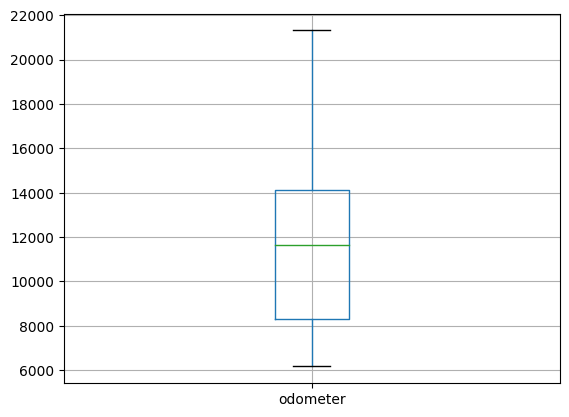

In [104]:
data[data['age']==-1].boxplot('odometer')

Среднее и медиана практически равны = `12018 и 11642`, что свидетельствует о том, что в данных сравнительно мало выбросов. Все данные лежат до 30000 миль пробега, а в среднем годовой пробег по штатам = 13476 миль. Считаем, что в столбце `sale_year` ошибка. Изменим дату продажы на 2015 год. 

In [105]:
data.loc[data['age']==-1, 'sale_year'] = 2015

In [106]:
data['age'] = data['sale_year'] - data['year']
data['age'].value_counts()

3     78716
2     78167
1     65479
4     36222
7     24868
8     23941
9     20613
5     20291
6     17116
10    16445
11    13287
0     11577
12    10182
13     7285
14     5026
15     3895
16     2496
17     1638
18     1149
19      651
20      502
21      299
22      162
23       93
24       51
25       34
27       12
26       11
29       10
30        7
28        5
31        4
32        1
33        1
Name: age, dtype: int64

**Вывод:** возраст авто посчитан корректно.

### Среднегодовой пробег

In [107]:
data['odometer'].describe()

count    440236.000000
mean      65537.442920
std       43062.656438
min          21.500000
25%       32158.000000
50%       45234.000000
75%      103394.000000
max      351724.000000
Name: odometer, dtype: float64

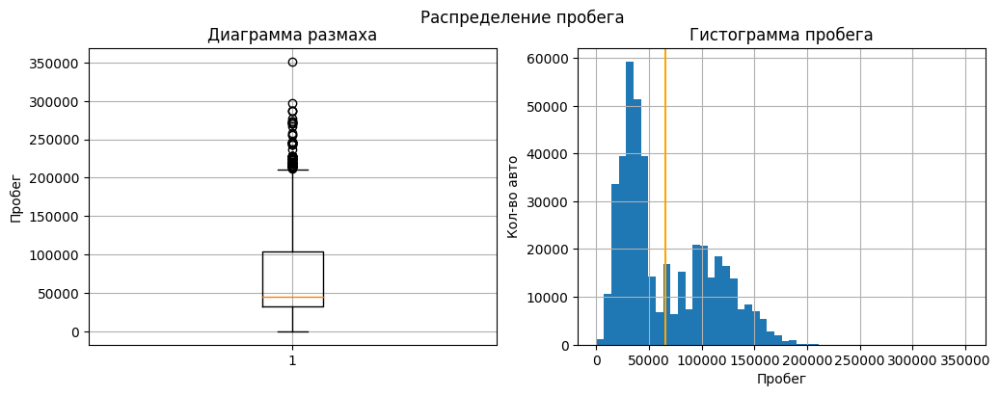

In [108]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.boxplot(data['odometer'].values)
ax2.hist(data['odometer'], bins=50)
ax2.axvline(x=data['odometer'].mean(), color='orange')


fig.suptitle('Распределение пробега')

ax1.set_title('Диаграмма размаха')
ax2.set_title('Гистограмма пробега')

ax1.set_ylabel('Пробег')
ax2.set_ylabel('Кол-во авто')
ax2.set_xlabel('Пробег')

ax1.grid()
ax2.grid()

plt.show()

In [109]:
# функция расчета среднегодового пробега
def year_mile(row):
    if row['age'] != 0:
        value = round(row['odometer'] / row['age'], 0)
    else: 
        value = row['odometer']
    return value

In [110]:
data['mile_year'] = data.apply(year_mile, axis=1)

In [111]:
data['mile_year'].describe()

count    440236.000000
mean      15240.047384
std        4579.490760
min          11.000000
25%       11977.000000
50%       14375.000000
75%       16841.000000
max       74874.000000
Name: mile_year, dtype: float64

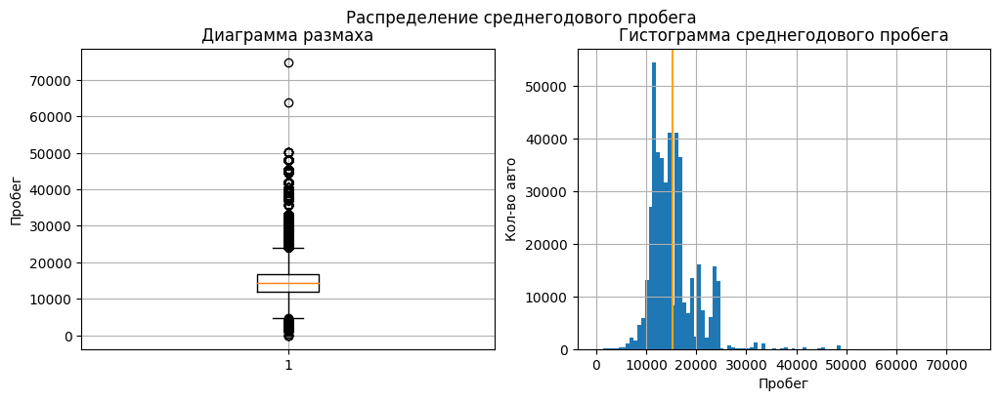

In [112]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.boxplot(data['mile_year'].values)
ax2.hist(data['mile_year'], bins=100, range=(0, 75000))
ax2.axvline(x=data['mile_year'].mean(), color='orange')


fig.suptitle('Распределение среднегодового пробега')

ax1.set_title('Диаграмма размаха')
ax2.set_title('Гистограмма среднегодового пробега')

ax1.set_ylabel('Пробег')
ax2.set_ylabel('Кол-во авто')
ax2.set_xlabel('Пробег')

ax1.grid()
ax2.grid()

plt.show()

При интенсивных поездках в год пробег автомобиля доходит до 80000 (например это среднеговодовой пробег в такси). Оставим значения менее 80000 среднегодового пробега.

**Вывод:** признак расчитан и добавлен.

### Медианный пробег авто в зависимости от года выпуска, марки

Пробег в завсисимости от марки и года

In [113]:
medians = data.groupby(by=['year', 'make'])['odometer'].agg('median').reset_index()

In [114]:
data = data.merge(medians, on=['year', 'make'], how='left')

In [115]:
data = data.rename(columns={'odometer_y': 'median_mile_make'})

In [116]:
data = data.rename(columns={'odometer_x': 'odometer'})

In [117]:
data[['median_mile_make']].describe()

,median_mile_make
count,440236.000000
mean,65509.169059
std,42985.414715
min,21.500000
25%,32158.000000
50%,45234.000000
75%,103394.000000
max,296901.000000


In [118]:
data.head()

,year,make,model,body,vin,state,color,interior,seller,sellingprice,...,transmission,condition,odometer,trim_lev,sale_year,sale_month,sale_day,age,mile_year,median_mile_make
0,2011,ford,edge,suv,2fmdk3jc4bba41556,md,black,black,santander consumer,12500,...,automatic,3.7,67365.0,se,2015,6,1,4,16841.0,67365.0
1,2014,ford,fusion,sedan,3fa6p0h75er208976,mo,black,black,ars/avis budget group,14500,...,automatic,4.2,23426.5,sel,2015,2,24,1,23426.0,23426.5
2,2012,nissan,sentra,sedan,3n1ab6ap4cl698412,nj,black,black,nissan-infiniti,9100,...,automatic,3.8,35812.0,slt,2015,6,9,3,11937.0,35812.0
3,2003,hummer,h2,suv,5grgn23u93h101360,tx,gold,beige,wichita falls ford lin,13300,...,automatic,2.4,114777.0,se,2015,6,16,12,9565.0,114777.0
4,2007,ford,fusion,sedan,3fahp08z17r268380,md,black,black,purple heart,1300,...,automatic,2.8,110831.0,se,2015,2,2,8,13854.0,110831.0


**Вывод:** признак расчитан и добавлен.

### Среднегодовое снижение рейтинга

In [119]:
#  функция расчета снижения рсостояния в год
def get_rate(row):
    rank = 5
    
    if row['age'] != 0:
        decrease = round((rank - row['condition']) / row['age'], 2)
    else: decrease = round(rank - row['condition'], 2)
    
    return decrease

In [120]:
data['cond_decrease_year'] = data.apply(get_rate, axis=1)

In [121]:
data['cond_decrease_year'].describe()

count    440236.000000
mean          0.439710
std           0.201951
min           0.060000
25%           0.290000
50%           0.400000
75%           0.550000
max           1.100000
Name: cond_decrease_year, dtype: float64

**Вывод:** признак расчитан и добавлен.

### Среднее число пробега, которое снижает состояния авто на 0.01 `milage_step`

Вычислим среднее число пробега, которое снижает состояния авто на 0.01:

In [122]:
def get_mile_step(row):
    if row['cond_decrease_year'] != 0:
        step = round((row['mile_year'] / row['cond_decrease_year']) * 0.01, 2)
    else: step = 0
        
    return step

In [123]:
data['milage_step'] = data.apply(get_mile_step, axis=1)

In [124]:
data['milage_step'].describe()

count    440236.000000
mean        386.824307
std         117.024121
min           0.200000
25%         292.350000
50%         382.660000
75%         502.860000
max        1597.080000
Name: milage_step, dtype: float64

**Вывод:** признак расчитан и добавлен.

### Класс авто

In [125]:
makers_rate = data.pivot_table(index='make', values='sellingprice', aggfunc='median').reset_index()#.sort_values(by='sellingprice', ascending=False)

In [126]:
makers_rate.sellingprice.describe()

count        58.000000
mean      22100.017241
std       30161.804925
min         400.000000
25%        7975.000000
50%       12150.000000
75%       20600.000000
max      152000.000000
Name: sellingprice, dtype: float64

In [127]:
def get_class(row):
    if row.sellingprice >= 30000:
        return 'lux'
    elif (row.sellingprice >= 10000) and (row.sellingprice < 30000):
        return 'comfort'
    else:
        return 'economy'

In [128]:
makers_rate['class'] = makers_rate.apply(get_class, axis=1)

In [129]:
makers_rate.groupby('class').agg(['mean', 'median'])

sellingprice       
                 mean median
class                       
comfort  15390.214286  13550
economy   4328.750000   3200
lux      76430.000000  64000

Добавим классы в датасет:

In [130]:
data = data.merge(makers_rate, on='make', how='left')

In [131]:
data = data.drop(columns='sellingprice_y')

In [132]:
data = data.rename(columns={'sellingprice_x': 'sellingprice'})

In [133]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 440236 entries, 0 to 440235
Data columns (total 25 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   year                440236 non-null  int64  
 1   make                440236 non-null  object 
 2   model               440236 non-null  object 
 3   body                440236 non-null  object 
 4   vin                 440236 non-null  object 
 5   state               440236 non-null  object 
 6   color               440236 non-null  object 
 7   interior            440236 non-null  object 
 8   seller              440236 non-null  object 
 9   sellingprice        440236 non-null  int64  
 10  county              440236 non-null  object 
 11  region              440236 non-null  object 
 12  transmission        440236 non-null  object 
 13  condition           440236 non-null  float64
 14  odometer            440236 non-null  float64
 15  trim_lev            440236 non-nul

**Вывод:** признак класса авто добавлен.

## Вывод по предобработке

Всего в данных содержалось `440236` строк и 14 признаков, не считая таргета.

Была проведена предобработка данных, в составе:
- устранены пропуски в признаках:
    - `make` = 8043
    - `model` = 8123
    - `trim` = 8337
    - `body` = 10393
    - `transmission` = 51461
    - `condition` = 9405
    - `odometer` = 69
    - `color` = 586
    - `interior` = 586
- выявлены и удалены явные дубликаты в признаке `vin`
- выявлены и устранены невные дубликаты в признаках:
    - `make`
    - `body`
    - `color`
    - `interior`
    - `trim`
    - `seller`
- были сгенерированы новые признаки:
    - год, месяц и день продажи авто
    - возраст авто на момент продажи
    - среднегодовой пробег
    - медианный пробег заданной модели авто в год выпуска
    - среднегодовое снижение состояния авто
    - средний пробег, снижающий состояние авто на 0.01 пункт
    - класс авто
 
Данные готовы для проведения EDA.

# EDA

In [134]:
pandas_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [135]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 440236 entries, 0 to 440235
Data columns (total 25 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   year                440236 non-null  int64  
 1   make                440236 non-null  object 
 2   model               440236 non-null  object 
 3   body                440236 non-null  object 
 4   vin                 440236 non-null  object 
 5   state               440236 non-null  object 
 6   color               440236 non-null  object 
 7   interior            440236 non-null  object 
 8   seller              440236 non-null  object 
 9   sellingprice        440236 non-null  int64  
 10  county              440236 non-null  object 
 11  region              440236 non-null  object 
 12  transmission        440236 non-null  object 
 13  condition           440236 non-null  float64
 14  odometer            440236 non-null  float64
 15  trim_lev            440236 non-nul

In [136]:
data.head()

,year,make,model,body,vin,state,color,interior,seller,sellingprice,...,trim_lev,sale_year,sale_month,sale_day,age,mile_year,median_mile_make,cond_decrease_year,milage_step,class
0,2011,ford,edge,suv,2fmdk3jc4bba41556,md,black,black,santander consumer,12500,...,se,2015,6,1,4,16841.0,67365.0,0.32,526.28,comfort
1,2014,ford,fusion,sedan,3fa6p0h75er208976,mo,black,black,ars/avis budget group,14500,...,sel,2015,2,24,1,23426.0,23426.5,0.80,292.82,comfort
2,2012,nissan,sentra,sedan,3n1ab6ap4cl698412,nj,black,black,nissan-infiniti,9100,...,slt,2015,6,9,3,11937.0,35812.0,0.40,298.43,comfort
3,2003,hummer,h2,suv,5grgn23u93h101360,tx,gold,beige,wichita falls ford lin,13300,...,se,2015,6,16,12,9565.0,114777.0,0.22,434.77,comfort
4,2007,ford,fusion,sedan,3fahp08z17r268380,md,black,black,purple heart,1300,...,se,2015,2,2,8,13854.0,110831.0,0.28,494.79,comfort


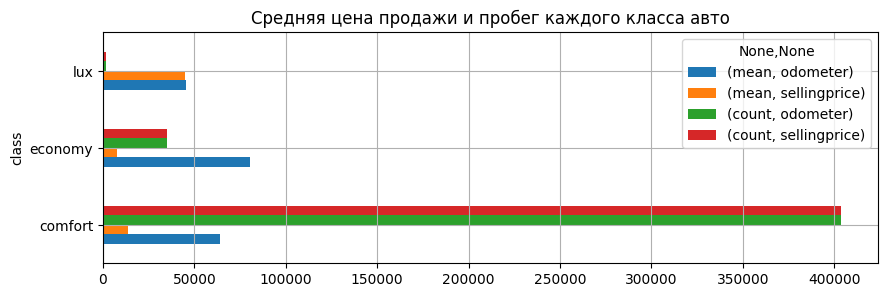

In [137]:
data.pivot_table(index='class', values=['odometer', 'sellingprice'], aggfunc=['mean', 'count']).plot(kind='barh', figsize=(10, 3))

plt.title('Средняя цена продажи и пробег каждого класса авто')
plt.grid()
plt.show()

**Вывод:** больше всего было продано комфорт-класса - более 400000 шт, что составляет почти весь объем данных, эконом-класс - около 30000 шт, а люкс измеряется в сотнях. Средний пробег выше у эконом сегмента - около 80000, далее комфорт - около 60000, на люксе пробег до 50000.

In [138]:
a = data.pivot_table(index='make', values=['vin', 'condition', 'sellingprice'], aggfunc=['count', 'mean'])
a.columns = ['condition_count', 'sellingprice_count', 'vin_count', 'condition_mean', 'sellingprice_mean']
a = a.drop(columns=['condition_count', 'sellingprice_count'])

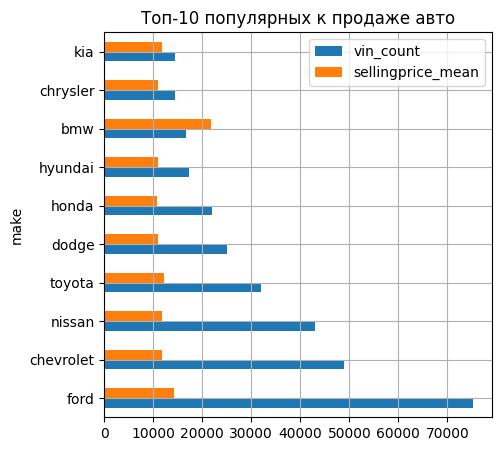

In [139]:
a[['vin_count', 'sellingprice_mean']].sort_values(by="vin_count", ascending=False).head(10).plot(kind='barh', figsize=(5, 5))

plt.title('Топ-10 популярных к продаже авто')
plt.grid()
plt.show()

Самая популярная марка для продажи:
- ford - 75301
- chevrolet	- 48924
- nissan - 43042
- toyota - 31915
- dodge - 24994
- honda - 21927
- hyundai - 17226
- bmw - 16633
- chrysler - 14499
- kia - 14360

In [140]:
a.sort_values(by="vin_count", ascending=False).head(10)

,vin_count,condition_mean,sellingprice_mean
make,,,
ford,75301,3.583594,14328.235375
chevrolet,48924,3.442591,11787.710490
nissan,43042,3.601443,11704.971795
toyota,31915,3.442247,12181.806235
dodge,24994,3.493226,11008.444947
honda,21927,3.272892,10790.613764
hyundai,17226,3.681058,11005.219378
bmw,16633,3.373384,21840.049720
chrysler,14499,3.496572,10908.285123


In [141]:
top_10 = a.sort_values(by="vin_count", ascending=False).head(10).index.tolist()

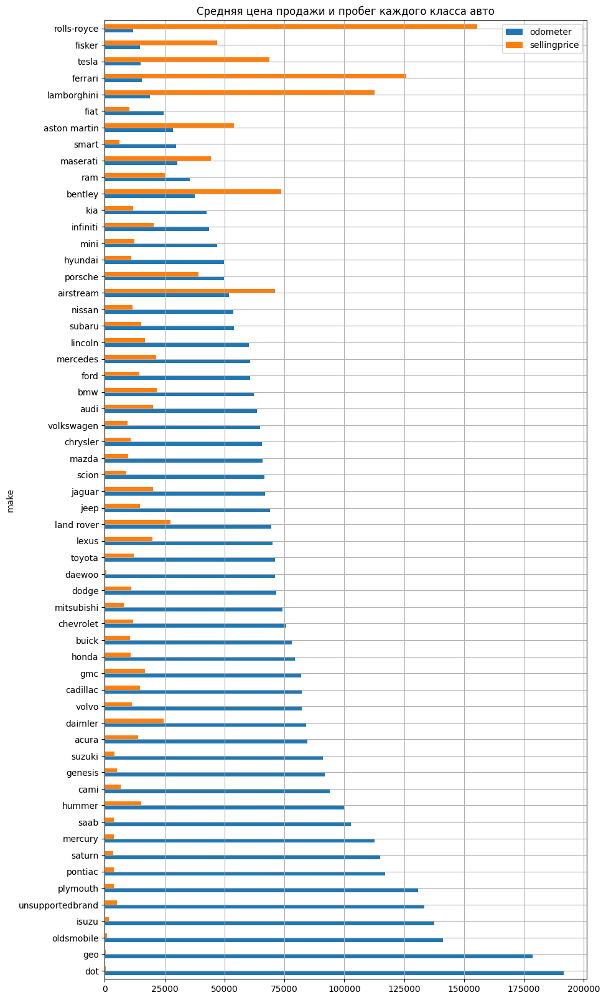

In [142]:
a = data.pivot_table(index='make', values=['sellingprice', 'odometer', 'age'], aggfunc=['mean'])
a.columns = ['age', 'odometer', 'sellingprice']

a[['odometer', 'sellingprice']].sort_values(by=['odometer', 'sellingprice'], ascending=False).plot(kind='barh', figsize=(10, 20))

plt.title('Средняя цена продажи и пробег каждого класса авто')
plt.grid()
plt.show()

In [143]:
print('\033[1mОписательная статистика машин с пробегом больше медианного:')
display(a[a['odometer'] > a['odometer'].mean()].sort_values(by=['odometer'], ascending=False).describe())

Описательная статистика машин с пробегом больше медианного:


,age,odometer,sellingprice
count,23.000000,23.000000,23.000000
mean,9.484365,106971.083167,7865.696346
std,4.092270,32422.064810,6241.332369
min,4.969913,74128.637908,476.562500
25%,6.566559,82228.073385,3710.614044
50%,7.888889,93912.555556,5118.292683
75%,11.609612,123944.679302,11608.164068
max,19.375000,191734.000000,24664.285714


In [144]:
print('\033[1mОписательная статистика машин с пробегом меньше медианного:')
display(a[a['odometer'] <= a['odometer'].mean()].sort_values(by=['odometer'], ascending=False).describe())

Описательная статистика машин с пробегом меньше медианного:


,age,odometer,sellingprice
count,35.000000,35.000000,35.000000
mean,4.952429,48941.241937,33015.607459
std,2.213864,19453.731573,36205.333997
min,1.764706,11888.000000,600.000000
25%,3.805503,32898.090411,11356.708371
50%,5.036415,53675.162783,19902.431638
75%,5.564037,65783.597365,41725.342522
max,14.000000,71604.912559,155450.000000


Как правило, чем больше пробег, тем ниже цена. Так же на более дорогих машинах пробег заметно ниже, чем на машинах из эконом класса. 

- машины, чей пробег больше медианного пробега, продают в среднем после 8-10 лет использования по цене 5000-8000 у.е.
- машины, чей пробег меньше или равен медианному пробегу, продают в среднем после 5 лет использования по цене 20000-33000 у.е. (верхний порог связан с наличием авто из класса люкс)

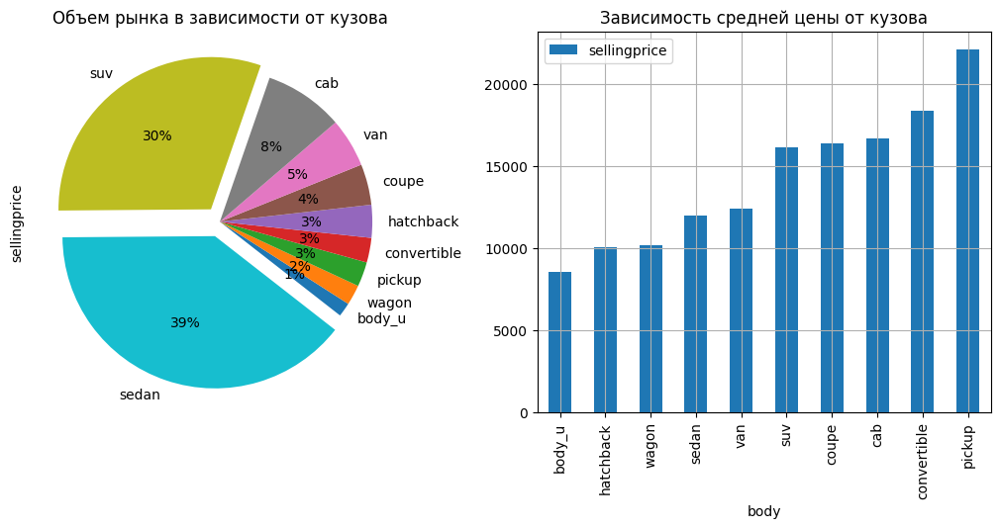

In [145]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (13,5))

data.groupby(['body']).agg('sum')[['sellingprice']].sort_values(by='sellingprice').plot(kind='pie', 
                                                                                        subplots=True, 
                                                                                        legend=False, 
                                                                                        autopct='%1.0f%%',
                                                                                        explode=(0, 0, 0, 0, 0, 0, 0, 0, 0.1, 0.1),
                                                                                        startangle=-38,
                                                                                        ax = axes[0])

data.groupby(['body']).agg('mean')[['sellingprice']].sort_values(by='sellingprice').plot(kind='bar', grid=True, ax = axes[1])

axes[0].set_title('Объем рынка в зависимости от кузова')
axes[1].set_title('Зависимость средней цены от кузова')

plt.show()

In [146]:
sedan = data[data['body']=='sedan'].groupby(['make']).agg('mean')[['sellingprice']].sort_values(by='sellingprice')[['sellingprice']].reset_index(drop=False)
sedan_top10 = sedan.tail(10)
sedan_other = pd.DataFrame(data={'make': ['other'],
                                 'sellingprice': sedan['sellingprice'][:-10].mean()})
data_sedan = pd.concat([sedan_top10, sedan_other]).reset_index(drop=True)

suv = data[data['body']=='suv'].groupby(['make']).agg('mean')[['sellingprice']].sort_values(by='sellingprice')[['sellingprice']].reset_index(drop=False)
suv_top10 = suv.tail(10)
suv_other = pd.DataFrame(data={'make': ['other'],
                                 'sellingprice': suv['sellingprice'][:-10].mean()})
data_suv = pd.concat([suv_top10, suv_other]).reset_index(drop=True)

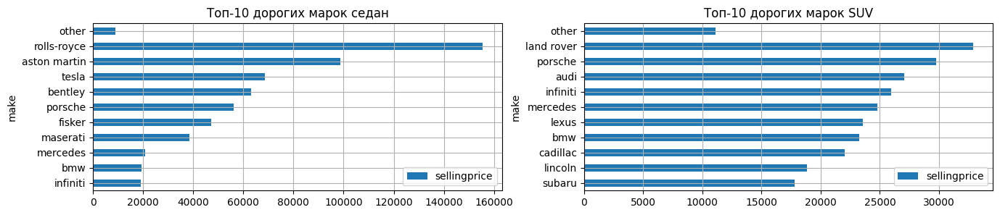

In [147]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (16,3))

data_sedan.plot(x='make', y='sellingprice', kind='barh', grid=True, ax = axes[0])
data_suv.plot(x='make', y='sellingprice', kind='barh', grid=True, ax = axes[1])

axes[0].set_title('Топ-10 дорогих марок седан')
axes[1].set_title('Топ-10 дорогих марок SUV')

plt.show()

Более 69% всего объема рынка б/у авто занимают седаны (39%)  и SUV (30%). 

Из *седанов* дороже всего продаются марки (по средней цене):
- rolls-royce	`155450`
- aston martin	`98750`
- tesla	`68688`
- bentley	`62990`
- porsche	`56049`
- fisker	`47021`
- maserati	`38592`
- mercedes	`20821`
- bmw	`19444`
- infiniti	`19133`

Из *SUV* дороже всего продаются марки (по средней цене):
- land rover	`32901`
- porsche	`29772`
- audi	`27035`
- infiniti	`25952`
- mercedes	`24776`
- lexus	`23568`
- bmw	`23239`
- cadillac	`22021`
- lincoln	`18831`
- subaru	`17829`

Самые дорогие машины с кузовом (по средней цене): 
- pickup - `22074`
- convertible - `18317`
- cab - `16678`
- coupe - `16380`
- suv - `16101`



## Вывод

**1.** Всего в базе находится информация о `440236` авто. Их можно разделить на три класса со следующим распределением:
1. comfort - 403718 - `91.7%`
2. economy - 35046 - `8.0%`
3. lux - 1472 - `0.3%`

Не смотря на преобладающую долю комфорт класса, средний пробег выше у эконом сегмента - около `80000`, далее комфорт - около `60000`, на люксе пробег до `50000`.  
- машины, чей пробег больше медианного пробега, продают в среднем после 8-10 лет использования по цене 5000-8000 у.е.
- машины, чей пробег меньше или равен медианному пробегу, продают в среднем после 5 лет использования по цене 20000-33000 у.е. (верхний порог связан с наличием авто из класса люкс)


**2.** На рынке б/у автомобилей больше всего представлены следующие марки:
- ford - 75301
- chevrolet	- 48924
- nissan - 43042

**Более 69% всего объема рынка б/у авто занимают седаны (39%)  и SUV (30%).**

Из *седанов* дороже всего продаются марки (по средней цене):
- rolls-royce	`155450`
- aston martin	`98750`
- tesla	`68688`
- bentley	`62990`
- porsche	`56049`

Из *SUV* дороже всего продаются марки (по средней цене):
- land rover	`32901`
- porsche	`29772`
- audi	`27035`
- infiniti	`25952`
- mercedes	`24776`

Самые дорогие машины с кузовом (по средней цене): 
- pickup - `22074`
- convertible - `18317`
- cab - `16678`
- coupe - `16380`
- suv - `16101`





In [148]:
# num_features = data.select_dtypes(include=['int', 'float']).columns.tolist()

In [149]:
# %%time

# phik_matrix = data_copy.phik_matrix(interval_cols=num_features)
# phik_matrix.round(2)

In [150]:
# plot_correlation_matrix(phik_matrix.values, 
#                         x_labels=phik_matrix.columns, 
#                         y_labels=phik_matrix.index, 
#                         vmin=0, vmax=1, color_map="Reds", 
#                         title=r"Корреляция $\phi_K$", 
#                         fontsize_factor=0.8, 
#                         figsize=(12, 10))
# plt.tight_layout()
# plt.show()

# Датасет `test`

In [151]:
test = pd.read_csv('test.csv')
test.head()

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,saledate
0,2005,Cadillac,CTS,Base,Sedan,automatic,1g6dp567450124779,ca,2.7,116970.0,silver,black,lexus of stevens creek,Wed Jan 14 2015 04:30:00 GMT-0800 (PST)
1,2014,GMC,Savana Cargo,2500,Van,NaN,1gtw7fca7e1902207,pa,4.4,6286.0,white,gray,u-haul,Fri Feb 27 2015 01:00:00 GMT-0800 (PST)
2,2013,Nissan,Murano,S,SUV,automatic,jn8az1mw6dw303497,oh,4.6,11831.0,gray,black,nissan-infiniti lt,Tue Feb 24 2015 01:30:00 GMT-0800 (PST)
3,2013,Chevrolet,Impala,LS Fleet,Sedan,automatic,2g1wf5e34d1160703,fl,2.3,57105.0,silver,black,onemain rem/auto club of miami inc dba north dad,Fri Mar 06 2015 02:00:00 GMT-0800 (PST)
4,2013,Nissan,Titan,SV,Crew Cab,automatic,1n6aa0ec3dn301209,tn,2.9,31083.0,black,black,nissan north america inc.,Wed Jun 03 2015 03:30:00 GMT-0700 (PDT)


In [152]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110058 entries, 0 to 110057
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          110058 non-null  int64  
 1   make          107997 non-null  object 
 2   model         107979 non-null  object 
 3   trim          107944 non-null  object 
 4   body          107464 non-null  object 
 5   transmission  97047 non-null   object 
 6   vin           110058 non-null  object 
 7   state         110058 non-null  object 
 8   condition     107679 non-null  float64
 9   odometer      110039 non-null  float64
 10  color         109900 non-null  object 
 11  interior      109900 non-null  object 
 12  seller        110058 non-null  object 
 13  saledate      110058 non-null  object 
dtypes: float64(2), int64(1), object(11)
memory usage: 11.8+ MB


## Предобработка данных

### Признаки `make` and `model`

Так как в ячейках, где пропущены марки, так же пропущены и модели, что ровным счетом обнудяет всю полученную информацию о лоте, удалим все строки с пропущенными моделями  

In [153]:
test.loc[test['make'].isna(), 'make'] = test.loc[test['make'].isna(), 'vin'].apply(lambda x: Vin(x).annotate()['Manufacturer'])

Добавим страну и регион из VIN:

In [154]:
test['county'] = test['vin'].apply(lambda x: Vin(x).annotate()['Country'])
test['region'] = test['vin'].apply(lambda x: Vin(x).annotate()['Region'])

In [155]:
test.head(2)

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,saledate,county,region
0,2005,Cadillac,CTS,Base,Sedan,automatic,1g6dp567450124779,ca,2.7,116970.0,silver,black,lexus of stevens creek,Wed Jan 14 2015 04:30:00 GMT-0800 (PST),United States,North America
1,2014,GMC,Savana Cargo,2500,Van,NaN,1gtw7fca7e1902207,pa,4.4,6286.0,white,gray,u-haul,Fri Feb 27 2015 01:00:00 GMT-0800 (PST),United States,North America


Заполним пропуски в столбце `model` значением `mu` - *model unknown*:

In [156]:
test.loc[test['model'].isna(), 'model'] = test.loc[test['model'].isna(), 'model'].fillna('mu')

In [157]:
test.isna().sum()

year                0
make                0
model               0
trim             2114
body             2594
transmission    13011
vin                 0
state               0
condition        2379
odometer           19
color             158
interior          158
seller              0
saledate            0
county              0
region              0
dtype: int64

**Вывод**: пропуски в столбцах `make` и `model` устранены. 

### Признак `transmission`

In [158]:
trans_modes = test.groupby(by=['year', 'make', 'model'])['transmission'].apply(lambda x: pd.Series.mode(x)).reset_index()

In [159]:
trans_modes['transmission'].value_counts(dropna=False)

automatic    4522
manual        268
Name: transmission, dtype: int64

In [160]:
test = test.merge(trans_modes, on=['year', 'make', 'model'], how='left')

In [161]:
trans_modes = test.groupby(by=['year', 'make'])['transmission_x'].apply(lambda x: pd.Series.mode(x)).reset_index()

In [162]:
trans_modes['transmission_x'].value_counts(dropna=False)

automatic    958
manual        49
Name: transmission_x, dtype: int64

In [163]:
test = test.merge(trans_modes, on=['year', 'make'], how='left')

In [164]:
def get_tran(row):
    if pd.isna(row['transmission_y']):
        value = row['transmission_x_y']
    else: 
        value = row['transmission_y']

    return value

In [165]:
test['transmission'] = test.apply(get_tran, axis=1)

In [166]:
test = test.drop(columns=['transmission_y', 'transmission_x_y'])

In [167]:
trans_modes = test.groupby(by=['year'])['transmission_x_x'].apply(lambda x: pd.Series.mode(x)).reset_index()

In [168]:
test = test.merge(trans_modes, on=['year'], how='left')

In [169]:
def get_tran_one(row):
    if pd.isna(row['transmission']):
        value = row['transmission_x_x_y']
    else: 
        value = row['transmission']

    return value

In [170]:
test['transmission'] = test.apply(get_tran_one, axis=1)

In [171]:
test = test.drop(columns=['transmission_x_x_x', 'transmission_x_x_y', 'level_1', 'level_2', 'level_3'])

In [172]:
test['transmission'].value_counts()

automatic    109290
manual         1125
Name: transmission, dtype: int64

In [173]:
test.isna().sum()

year               0
make               0
model              0
trim            2135
body            2626
vin                0
state              0
condition       2401
odometer          19
color            159
interior         159
seller             0
saledate           0
county             0
region             0
transmission       0
dtype: int64

### Признаки `trim`, `body`, `color`, `interior`

**Исследуем столбцы:**
- `trim` - заменим пропуски на `trim_u` - *trim unknown*;
- `body` - заменим пропуски на `body_u` - *body unknown*;
- `color` - заменим пропуски на `color_u` - *color unknown*;
- `interior` - заменим пропуски на `interior_u` - *interior unknown*;

In [174]:
test.loc[test['trim'].isna(), 'trim'] = test.loc[test['trim'].isna(), 'trim'].fillna('trim_u')
test.loc[test['body'].isna(), 'body'] = test.loc[test['body'].isna(), 'body'].fillna('body_u')
test.loc[test['color'].isna(), 'color'] = test.loc[test['color'].isna(), 'color'].fillna('color_u')
test.loc[test['interior'].isna(), 'interior'] = test.loc[test['interior'].isna(), 'interior'].fillna('interior_u')

In [175]:
test.isna().sum()

year               0
make               0
model              0
trim               0
body               0
vin                0
state              0
condition       2401
odometer          19
color              0
interior           0
seller             0
saledate           0
county             0
region             0
transmission       0
dtype: int64

### Признак `condition`

In [176]:
test['condition'].describe()

count    108014.000000
mean          3.421613
std           0.951996
min           1.000000
25%           2.700000
50%           3.600000
75%           4.200000
max           5.000000
Name: condition, dtype: float64

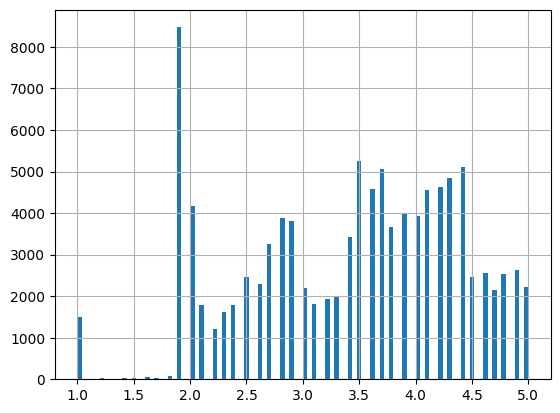

In [177]:
test['condition'].hist(bins=100)
plt.show()

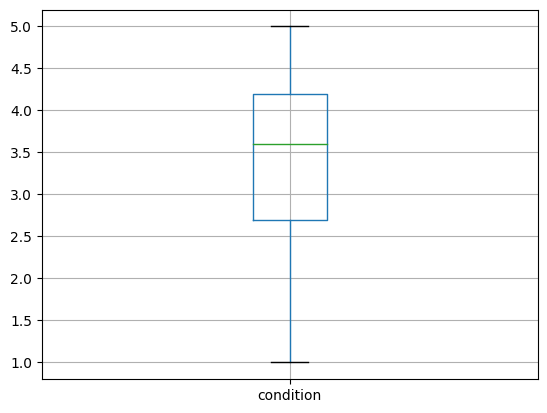

In [178]:
test.boxplot('condition')
plt.show()

In [179]:
cond_model = test.groupby(by=['year', 'make', 'model'])['condition'].agg('median').reset_index()
cond_make = test.groupby(by=['year', 'make'])['condition'].agg('median').reset_index()
cond_year = test.groupby(by=['year'])['condition'].agg('median').reset_index()    

In [180]:
test = test.merge(cond_model, on=['year', 'make', 'model'], how='left')

In [181]:
test = test.merge(cond_make, on=['year', 'make'], how='left')

In [182]:
test = test.merge(cond_year, on=['year'], how='left')

In [183]:
test.columns = ['year', 'make', 'model', 'trim', 'body', 'vin', 'state', 'condition_x',
       'odometer', 'color', 'interior', 'seller', 'saledate', 'county',
       'region', 'transmission', 'condition_y', 'condition_x', 'condition']

In [184]:
test = test.drop(columns=['condition_x', 'condition_y'])

In [185]:
test.isna().sum()

year             0
make             0
model            0
trim             0
body             0
vin              0
state            0
odometer        19
color            0
interior         0
seller           0
saledate         0
county           0
region           0
transmission     0
condition        0
dtype: int64

### Признак `odometer`

Заменим пробег автомобиля медианным значением пробега автомобиля в группе по году и модели. 

In [186]:
odom_model = test.groupby(by=['year', 'make', 'model'])['odometer'].agg('median').reset_index()

In [187]:
test = test.merge(odom_model, on=['year', 'make', 'model'], how='left')

In [188]:
test[test['odometer_y'].isna()]

,year,make,model,trim,body,vin,state,odometer_x,color,interior,seller,saledate,county,region,transmission,condition,odometer_y
101491,2003,Volvo,XC70,Base,Wagon,yv1sz59h931104323,oh,NaN,blue,tan,asset motors llc,Tue Dec 23 2014 09:30:00 GMT-0800 (PST),Sweden,Europe,automatic,2.4,NaN


In [189]:
odom_make = test.groupby(by=['year', 'make'])['odometer_x'].agg('median').reset_index()

In [190]:
test = test.merge(odom_make, on=['year', 'make'], how='left')

In [191]:
test = test.drop(columns=['odometer_x_x', 'odometer_y'])
test = test.rename(columns={'odometer_x_y': 'odometer'})

In [192]:
test.isna().sum()

year            0
make            0
model           0
trim            0
body            0
vin             0
state           0
color           0
interior        0
seller          0
saledate        0
county          0
region          0
transmission    0
condition       0
odometer        0
dtype: int64

**Вывод**: Все пропуски устранены. 

### Вывод

Датасет был наполнен пропущенными значениями в следующих признаках:
- `make` = 2135
- `model` = 2626
- `trim` = 8337
- `body` = 10393
- `condition` = 2401
- `odometer` = 19
- `color` = 159
- `interior` = 159

Пропуски в категориальных признаках `trim`, `body`, `color` и `interior` были заменнены на эквивалент, что признак неизвестен. 

Пропуски в категориальных признаках `make` и `model` были заменены значением из VIN и эквивалентом неизвестной модели.

Количественные признаки `condition` и `odometer` были заменены медианным значением по марке/модели авто, сгруппированному по году выпуска. 

Добавлены новые признаки `country` и `region` взятые из VIN. 

Все пропуски были обработаны. 

## Тип данных

Скорректировать тип данных надо только у одиного признака - `saledate`. Приведем его к читаемому виду `datestamp`

In [193]:
test['saledate'] = pd.to_datetime(test['saledate'], utc=True)

In [194]:
test['saledate'].dtype

datetime64[ns, UTC]

**Вывод**: тип даты корректный. 

## Проверка дубликатов

In [195]:
test['vin'].duplicated().sum()

357

In [196]:
test = test.drop_duplicates(subset='vin').reset_index(drop=True)

In [197]:
test['vin'].duplicated().sum()

0

Явных дубликаты по признаку `vin` удалены. 

Проверим категориальные признаки на неявные дубликаты:

In [198]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110058 entries, 0 to 110057
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype              
---  ------        --------------   -----              
 0   year          110058 non-null  int64              
 1   make          110058 non-null  object             
 2   model         110058 non-null  object             
 3   trim          110058 non-null  object             
 4   body          110058 non-null  object             
 5   vin           110058 non-null  object             
 6   state         110058 non-null  object             
 7   color         110058 non-null  object             
 8   interior      110058 non-null  object             
 9   seller        110058 non-null  object             
 10  saledate      110058 non-null  datetime64[ns, UTC]
 11  county        110058 non-null  object             
 12  region        110058 non-null  object             
 13  transmission  110058 non-null  object       

In [199]:
vins = ['1g6dp567450124779',
        '1gtw7fca7e1902207',
        'jn8az1mw6dw303497',
        '2g1wf5e34d1160703',
        '1n6aa0ec3dn301209',
        'wvwvd63b93e175638',
        '5npeb4ac4dh809686',
        '1fm5k7b97dgb16454',
        'jn1cv6ar5bm411441']

for vin in vins:
    if test[test['vin']==vin]['vin'].values == vin:
        print(True)
    else: print(False)

True
True
True
True
True
True
True
True
True


### Признак `make`

In [200]:
cat_col_test = test.select_dtypes(include=['object'])

In [201]:
test['make'] = test['make'].str.lower()

In [202]:
test['make'].sort_values().unique()

array(['acura', 'aston martin', 'audi', 'bentley', 'bmw', 'buick',
       'cadillac', 'cami', 'chev truck', 'chevrolet', 'chevrolet canada',
       'chevrolet mexico', 'chevrolet usa', 'chrysler', 'chrysler canada',
       'daewoo', 'daimlerchrysler ag/daimler ag', 'dodge', 'dodge canada',
       'dodge mexico', 'ferrari', 'fiat', 'fisker', 'ford', 'ford tk',
       'genesis', 'geo', 'gmc', 'gmc truck', 'honda', 'hummer', 'hyundai',
       'hyundai tk', 'infiniti', 'isuzu', 'jaguar', 'jeep', 'kia',
       'land rover', 'landrover', 'lexus', 'lexus canada', 'lincoln',
       'lotus', 'maserati', 'mazda', 'mercedes', 'mercedes-benz',
       'mercedes-benz (sprinter)', 'mercury', 'mini', 'mitsubishi',
       'nissan', 'oldsmobile', 'plymouth', 'pontiac', 'porsche',
       'porsche car', 'ram', 'rolls-royce', 'saab', 'saturn', 'scion',
       'smart', 'subaru', 'suzuki', 'tesla', 'toyota', 'volkswagen',
       'volvo', 'vw'], dtype=object)

In [203]:
# test['make'] = test['make'].replace('chev truck', 'chevrolet')
# test['make'] = test['make'].replace('daimlerchrysler ag/daimler ag', 'daimler')
# test['make'] = test['make'].replace('ford tk', 'ford')
# test['make'] = test['make'].replace('gmc truck', 'gmc')
# test['make'] = test['make'].replace('land rover', 'landrover')
# test['make'] = test['make'].replace('hyundai tk', 'hyundai')
# # test['make'] = test['make'].replace('mercedes-b', 'mercedes')
# test['make'] = test['make'].replace('mercedes-benz', 'mercedes')
# test['make'] = test['make'].replace('mercedes-benz (sprinter)', 'mercedes')
# test['make'] = test['make'].replace('porsche car', 'porsche')
# # test['make'] = test['make'].replace('porsche suv', 'porsche')
# test['make'] = test['make'].replace('vw', 'volkswagen')
# # test['make'] = test['make'].replace('volkswagen commercial vehicles', 'volkswagen')

In [204]:
test['make'] = test['make'].replace('am', 'aston martin')
test['make'] = test['make'].replace('bmw m', 'bmw')
test['make'] = test['make'].replace('chev truck', 'chevrolet')
test['make'] = test['make'].replace('chevrolet canada', 'chevrolet')
test['make'] = test['make'].replace('chevrolet mexico', 'chevrolet')
test['make'] = test['make'].replace('chevrolet usa', 'chevrolet')
test['make'] = test['make'].replace('chrysler canada', 'chrysler')
test['make'] = test['make'].replace('daimler ag (sprinter)', 'daimler')
test['make'] = test['make'].replace('daimlerchrysler ag/daimler ag', 'daimler')
test['make'] = test['make'].replace('dodge canada', 'dodge')
test['make'] = test['make'].replace('dodge mexico', 'dodge')
test['make'] = test['make'].replace('dodge tk', 'dodge')
test['make'] = test['make'].replace('ford truck', 'ford')
test['make'] = test['make'].replace('ford tk', 'ford')
test['make'] = test['make'].replace('gmc truck', 'gmc')
test['make'] = test['make'].replace('hyundai tk', 'hyundai')
test['make'] = test['make'].replace('landrover', 'land rover')
test['make'] = test['make'].replace('lexus canada', 'lexus')
test['make'] = test['make'].replace('mazda tk', 'mazda')
test['make'] = test['make'].replace('mercedes-b', 'mercedes')
test['make'] = test['make'].replace('mercedes-benz', 'mercedes')
test['make'] = test['make'].replace('mercedes-benz (sprinter)', 'mercedes')
test['make'] = test['make'].replace('porsche car', 'porsche')
test['make'] = test['make'].replace('porsche suv', 'porsche')
test['make'] = test['make'].replace('vw', 'volkswagen')
test['make'] = test['make'].replace('volkswagen commercial vehicles', 'volkswagen')

In [205]:
test['make'].sort_values().unique()

array(['acura', 'aston martin', 'audi', 'bentley', 'bmw', 'buick',
       'cadillac', 'cami', 'chevrolet', 'chrysler', 'daewoo', 'daimler',
       'dodge', 'ferrari', 'fiat', 'fisker', 'ford', 'genesis', 'geo',
       'gmc', 'honda', 'hummer', 'hyundai', 'infiniti', 'isuzu', 'jaguar',
       'jeep', 'kia', 'land rover', 'lexus', 'lincoln', 'lotus',
       'maserati', 'mazda', 'mercedes', 'mercury', 'mini', 'mitsubishi',
       'nissan', 'oldsmobile', 'plymouth', 'pontiac', 'porsche', 'ram',
       'rolls-royce', 'saab', 'saturn', 'scion', 'smart', 'subaru',
       'suzuki', 'tesla', 'toyota', 'volkswagen', 'volvo'], dtype=object)

### Признаки `model` и `body`

In [206]:
test['model'] = test['model'].str.lower()

In [207]:
test['body'] = test['body'].str.lower()
test['body'].sort_values().unique()

array(['access cab', 'beetle convertible', 'body_u', 'cab plus',
       'club cab', 'convertible', 'coupe', 'crew cab', 'crewmax cab',
       'cts coupe', 'cts wagon', 'cts-v coupe', 'double cab',
       'e-series van', 'elantra coupe', 'extended cab', 'g convertible',
       'g coupe', 'g sedan', 'g37 convertible', 'g37 coupe',
       'genesis coupe', 'granturismo convertible', 'hatchback',
       'king cab', 'koup', 'mega cab', 'minivan', 'promaster cargo van',
       'q60 convertible', 'q60 coupe', 'quad cab', 'regular cab',
       'regular-cab', 'sedan', 'supercab', 'supercrew', 'suv',
       'transit van', 'tsx sport wagon', 'van', 'wagon', 'xtracab'],
      dtype=object)

In [208]:
test['body'] = test.apply(get_body, axis=1).str.lower()

In [209]:
test['body'].value_counts()

sedan          48970
suv            28295
cab             7471
van             6414
hatchback       5152
coupe           3995
wagon           3287
body_u          2594
convertible     2149
pickup          1731
Name: body, dtype: int64

### Признаки `color` и `interior`

In [210]:
test['color'] = test['color'].replace('—', 'color_u')

In [211]:
test['color'].sort_values().unique().tolist()

['beige',
 'black',
 'blue',
 'brown',
 'burgundy',
 'charcoal',
 'color_u',
 'gold',
 'gray',
 'green',
 'lime',
 'off-white',
 'orange',
 'pink',
 'purple',
 'red',
 'silver',
 'turquoise',
 'white',
 'yellow']

Рассмотрим признак `interior`

In [212]:
test['interior'].value_counts()

black         48176
gray          34984
beige         11931
tan            8658
—              3380
brown          1664
red             264
blue            241
silver          225
interior_u      158
off-white       107
gold             64
purple           58
green            44
burgundy         34
white            33
orange           33
yellow            4
Name: interior, dtype: int64

In [213]:
test['interior'] = test['interior'].replace('—', 'interior_u')

In [214]:
test['interior'].value_counts()

black         48176
gray          34984
beige         11931
tan            8658
interior_u     3538
brown          1664
red             264
blue            241
silver          225
off-white       107
gold             64
purple           58
green            44
burgundy         34
white            33
orange           33
yellow            4
Name: interior, dtype: int64

In [215]:
test.head(1)

,year,make,model,trim,body,vin,state,color,interior,seller,saledate,county,region,transmission,condition,odometer
0,2005,cadillac,cts,Base,sedan,1g6dp567450124779,ca,silver,black,lexus of stevens creek,2015-01-13 20:30:00+00:00,United States,North America,automatic,2.6,111130.0


### Признак `trim`

In [216]:
print(f'Всего уникальных значений trim = {test["trim"].nunique()}')

Всего уникальных значений trim = 1497


In [217]:
test['trim_cleared'] = test['trim'].apply(clear)

In [218]:
print(f'Всего уникальных значений после первой обработки = {test.trim_cleared.nunique()}')

Всего уникальных значений после первой обработки = 1029


In [219]:
# удалим пустые строки
test.loc[test['trim_cleared']=='', 'trim_cleared'] = test.loc[test['trim_cleared']=='', 'trim_cleared'].apply(lambda x: x.replace('', 'trim_u'))

In [220]:
# создадим "словарь" с уникальными значениями
trim_dict_test = pd.DataFrame({'trim_cleared': test.trim_cleared.unique().tolist()})

In [221]:
trim_dict_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1029 entries, 0 to 1028
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   trim_cleared  1029 non-null   object
dtypes: object(1)
memory usage: 8.2+ KB


In [222]:
trim_dict_test['trim_lev'] = trim_dict_test.apply(dist_lev, axis=1)

In [223]:
trim_dict_test.head(10)

,trim_cleared,trim_lev
0,base,se
1,trim_u,t
2,s,sel
3,ls fleet,ls
4,sv,v
5,gls t,gls
6,gls,ls
7,g x,g
8,ls,gls
9,lt,t


In [224]:
print(f'Всего уникальных значений после второй обработки = {trim_dict_test.trim_lev.nunique()}')

Всего уникальных значений после второй обработки = 423


In [225]:
# объединим обработанные значения с датасетом
test = test.merge(trim_dict_test, on='trim_cleared', how='left')

In [226]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110058 entries, 0 to 110057
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype              
---  ------        --------------   -----              
 0   year          110058 non-null  int64              
 1   make          110058 non-null  object             
 2   model         110058 non-null  object             
 3   trim          110058 non-null  object             
 4   body          110058 non-null  object             
 5   vin           110058 non-null  object             
 6   state         110058 non-null  object             
 7   color         110058 non-null  object             
 8   interior      110058 non-null  object             
 9   seller        110058 non-null  object             
 10  saledate      110058 non-null  datetime64[ns, UTC]
 11  county        110058 non-null  object             
 12  region        110058 non-null  object             
 13  transmission  110058 non-null  object       

In [227]:
test = test.drop(columns=['trim', 'trim_cleared'])

### Вывод

Были исправлены неявные дубликаты в признаках:
- `make`
- `body`
- `color`
- `interior`

## Генерация синтетических признаков

### год, месяц и день продажи

Выделим год, месяц и день продажи из `saledate`:

In [228]:
test['sale_year'] = test['saledate'].apply(lambda x: x.year)
test['sale_month'] = test['saledate'].apply(lambda x: x.month)
test['sale_day'] = test['saledate'].apply(lambda x: x.day)

In [229]:
test = test.drop(columns='saledate')

In [230]:
test = test.drop(columns=['sale_month', 'sale_day'])

In [231]:
test.head()

,year,make,model,body,vin,state,color,interior,seller,county,region,transmission,condition,odometer,trim_lev,sale_year
0,2005,cadillac,cts,sedan,1g6dp567450124779,ca,silver,black,lexus of stevens creek,United States,North America,automatic,2.6,111130.0,se,2015
1,2014,gmc,savana cargo,van,1gtw7fca7e1902207,pa,white,gray,u-haul,United States,North America,automatic,4.2,13294.5,t,2015
2,2013,nissan,murano,suv,jn8az1mw6dw303497,oh,gray,black,nissan-infiniti lt,Japan,Asia,automatic,3.9,32164.0,sel,2015
3,2013,chevrolet,impala,sedan,2g1wf5e34d1160703,fl,silver,black,onemain rem/auto club of miami inc dba north dad,Canada,North America,automatic,3.9,48023.0,ls,2015
4,2013,nissan,titan,cab,1n6aa0ec3dn301209,tn,black,black,nissan north america inc.,United States,North America,automatic,3.9,32164.0,v,2015


### Возраст авто на момент продажи

In [232]:
test['age'] = test['sale_year'] - test['year']

In [233]:
test['age'].value_counts()

 3     19698
 2     19642
 1     16384
 4      9074
 7      6136
 8      5926
 9      5157
 5      5133
 6      4275
 10     4141
 11     3314
 0      2896
 12     2553
 13     1753
 14     1236
 15      968
 16      622
 17      378
 18      297
 19      162
 20      119
 21       69
 22       35
-1        35
 23       21
 24       13
 25        8
 26        5
 29        3
 27        2
 28        1
 31        1
 33        1
Name: age, dtype: int64

Выявили некорректные данные - возраст автомобиля в 35 случаев = -1 год. Проверим детали:

In [234]:
test[test['age']==-1]['odometer'].describe()

count       35.000000
mean     13099.414286
std       5650.858937
min       6009.000000
25%       8116.500000
50%      14582.500000
75%      14582.500000
max      22272.000000
Name: odometer, dtype: float64

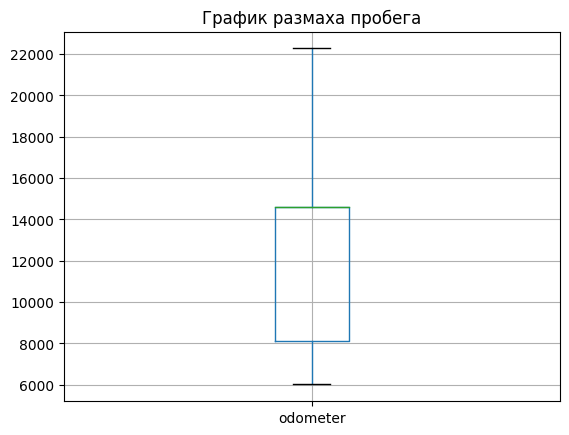

In [235]:
test[test['age']==-1].boxplot('odometer')
plt.title('График размаха пробега')

plt.show()

Среднее и медиана практически равны = `11244 и 10882`, что свидетельствует о том, что в данных сравнительно мало выбросов. Все данные лежат до 23000 миль пробега, а в среднем годовой пробег по штатам = 13099 миль. Считаем, что в столбце `sale_year` ошибка. Изменим дату продажы на 2015 год. 

In [236]:
test.loc[test['age']==-1, 'sale_year'] = 2015

In [237]:
test['age'] = test['sale_year'] - test['year']
test['age'].value_counts()

3     19698
2     19642
1     16384
4      9074
7      6136
8      5926
9      5157
5      5133
6      4275
10     4141
11     3314
0      2931
12     2553
13     1753
14     1236
15      968
16      622
17      378
18      297
19      162
20      119
21       69
22       35
23       21
24       13
25        8
26        5
29        3
27        2
28        1
31        1
33        1
Name: age, dtype: int64

In [238]:
test['odometer'].describe()

count    110058.000000
mean      65261.866025
std       42917.930530
min           1.000000
25%       32484.000000
50%       44555.500000
75%      102765.000000
max      379439.000000
Name: odometer, dtype: float64

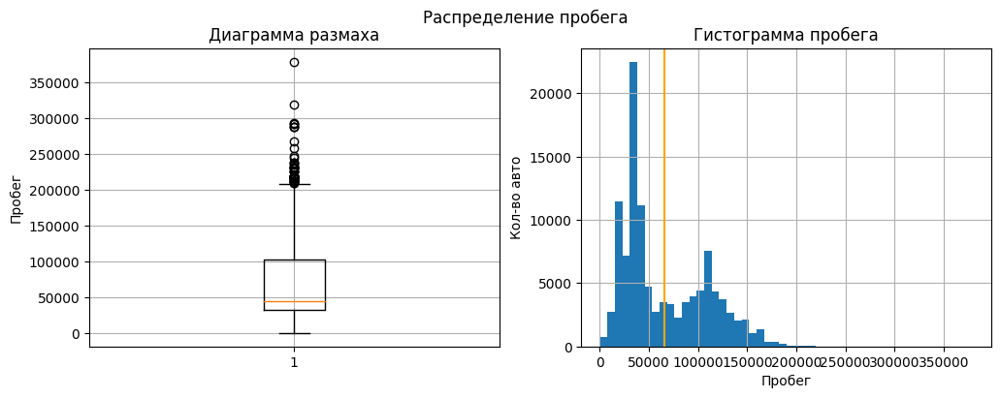

In [239]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.boxplot(test['odometer'].values)
ax2.hist(test['odometer'], bins=50)
ax2.axvline(x=test['odometer'].mean(), color='orange')


fig.suptitle('Распределение пробега')

ax1.set_title('Диаграмма размаха')
ax2.set_title('Гистограмма пробега')

ax1.set_ylabel('Пробег')
ax2.set_ylabel('Кол-во авто')
ax2.set_xlabel('Пробег')

ax1.grid()
ax2.grid()

plt.show()

In [240]:
test['mile_year'] = test.apply(year_mile, axis=1)

In [241]:
test['mile_year'].describe()

count    110058.000000
mean      15267.332093
std        4640.420731
min           0.000000
25%       11926.000000
50%       14431.000000
75%       16847.000000
max       49745.000000
Name: mile_year, dtype: float64

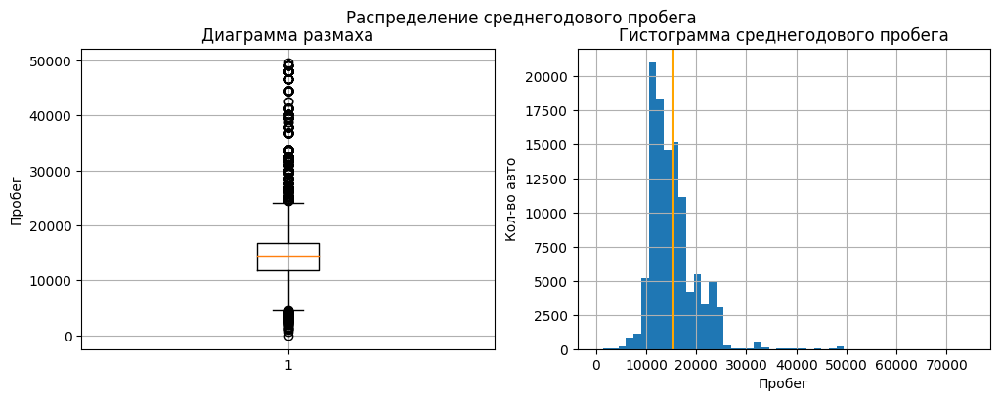

In [242]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.boxplot(test['mile_year'].values)
ax2.hist(test['mile_year'], bins=50, range=(0, 75000))
ax2.axvline(x=test['mile_year'].mean(), color='orange')


fig.suptitle('Распределение среднегодового пробега')

ax1.set_title('Диаграмма размаха')
ax2.set_title('Гистограмма среднегодового пробега')

ax1.set_ylabel('Пробег')
ax2.set_ylabel('Кол-во авто')
ax2.set_xlabel('Пробег')

ax1.grid()
ax2.grid()

plt.show()

При интенсивныъ поездках в год пробег автомобиля доходит до 50000 (например это среднеговодовой пробег в такси). Оставим все значения.

### Медианный пробег авто в зависимости от года выпуска, марки

Пробег в завсисимости от марки и года

In [243]:
medians = test.groupby(by=['year', 'make'])['odometer'].agg('median').reset_index()

In [244]:
test = test.merge(medians, on=['year', 'make'], how='left')

In [245]:
test = test.rename(columns={'odometer_y': 'median_mile_make'})

In [246]:
test = test.rename(columns={'odometer_x': 'odometer'})

In [247]:
test[['median_mile_make']].describe()

,median_mile_make
count,110058.000000
mean,65233.179623
std,42813.521589
min,1.000000
25%,32484.000000
50%,44555.500000
75%,102988.000000
max,291755.000000


In [248]:
test.head()

,year,make,model,body,vin,state,color,interior,seller,county,region,transmission,condition,odometer,trim_lev,sale_year,age,mile_year,median_mile_make
0,2005,cadillac,cts,sedan,1g6dp567450124779,ca,silver,black,lexus of stevens creek,United States,North America,automatic,2.6,111130.0,se,2015,10,11113.0,111130.0
1,2014,gmc,savana cargo,van,1gtw7fca7e1902207,pa,white,gray,u-haul,United States,North America,automatic,4.2,13294.5,t,2015,1,13294.0,13294.5
2,2013,nissan,murano,suv,jn8az1mw6dw303497,oh,gray,black,nissan-infiniti lt,Japan,Asia,automatic,3.9,32164.0,sel,2015,2,16082.0,32164.0
3,2013,chevrolet,impala,sedan,2g1wf5e34d1160703,fl,silver,black,onemain rem/auto club of miami inc dba north dad,Canada,North America,automatic,3.9,48023.0,ls,2015,2,24012.0,48023.0
4,2013,nissan,titan,cab,1n6aa0ec3dn301209,tn,black,black,nissan north america inc.,United States,North America,automatic,3.9,32164.0,v,2015,2,16082.0,32164.0


### Среднегодовое снижение рейтинга

In [249]:
test['cond_decrease_year'] = test.apply(get_rate, axis=1)

In [250]:
test['cond_decrease_year'].describe()

count    110058.000000
mean          0.440957
std           0.201511
min           0.030000
25%           0.300000
50%           0.400000
75%           0.550000
max           1.100000
Name: cond_decrease_year, dtype: float64

### Среднее число пробега, которое снижает состояния авто на 0.01 `milage_step`

Вычислим среднее число пробега, которое снижает состояния авто на 0.01:

In [251]:
test['milage_step'] = test.apply(get_mile_step, axis=1)

In [252]:
test['milage_step'].describe()

count    110058.000000
mean        385.394634
std         116.317863
min           0.000000
25%         295.310000
50%         375.360000
75%         499.180000
max        1290.620000
Name: milage_step, dtype: float64

### Класс авто

Добавим классы в датасет:

In [253]:
test = test.merge(makers_rate[['make', 'class']], on='make', how='left')

In [254]:
test.isna().sum()

year                  0
make                  0
model                 0
body                  0
vin                   0
state                 0
color                 0
interior              0
seller                0
county                0
region                0
transmission          0
condition             0
odometer              0
trim_lev              0
sale_year             0
age                   0
mile_year             0
median_mile_make      0
cond_decrease_year    0
milage_step           0
class                 1
dtype: int64

In [255]:
test[test['class'].isna()]

,year,make,model,body,vin,state,color,interior,seller,county,...,condition,odometer,trim_lev,sale_year,age,mile_year,median_mile_make,cond_decrease_year,milage_step,class
55695,2007,lotus,exige,coupe,sccvc11137hl80911,ca,black,black,gt3 auto group,United Kingdom,...,2.8,16932.0,sel,2015,8,2116.0,16932.0,0.28,75.57,NaN


In [256]:
test = test.fillna('lux')
test.isna().sum()

year                  0
make                  0
model                 0
body                  0
vin                   0
state                 0
color                 0
interior              0
seller                0
county                0
region                0
transmission          0
condition             0
odometer              0
trim_lev              0
sale_year             0
age                   0
mile_year             0
median_mile_make      0
cond_decrease_year    0
milage_step           0
class                 0
dtype: int64

Удалим ненужные признаки:

In [257]:
test = test.drop(columns=['state', 'color', 'interior', 'region'])

In [258]:
VIN = test[['vin']]

In [259]:
VIN

,vin
0,1g6dp567450124779
1,1gtw7fca7e1902207
2,jn8az1mw6dw303497
3,2g1wf5e34d1160703
4,1n6aa0ec3dn301209
...,...
110053,1j4aa2d17bl584330
110054,jthbf1d23e5007526
110055,1n4ba41e54c831950
110056,jn1az4eh3dm382431


In [260]:
test = test.drop(columns=['vin'])

### Полиномиальные признаки

In [261]:
# poly_features_test = poly_transformer.transform(test[poly_features])
# print('Polynomial Features shape: ', poly_features_test.shape)

In [262]:
# poly_features_test = pd.DataFrame(poly_features_test, 
#                              columns = poly_transformer.get_feature_names_out(['odometer', 'mile_year', 'milage_step']))

In [263]:
# poly_features_test.info()

In [264]:
# poly_features_test = poly_features_test.drop(columns=['1', 'odometer', 'mile_year', 'milage_step'])

In [265]:
# test = test.merge(poly_features_test, left_index=True, right_index=True)

In [266]:
# test.describe()

**Вывод:** полиномиальнве признаки по стобцам `odometer`, `mile_year` и `milage_step` созданы.

In [267]:
test = test.drop(columns=['county'])

# Проверка количеств признаков на обучающей и тестовой выборках

Удалим из датасета столбцы, которые не будут влиять на прогноз:

In [268]:
data = data.drop(columns=['sale_day', 'sale_month', 'state', 'color', 'interior', 'vin', 'region', 'county'])

In [269]:
data.columns.nunique()

17

In [270]:
test.columns.nunique()

16

**Вывод:** все признаки в тестовой и обучающей выборках совпадают.

# Разработка моделей

## Подготовка признаков 

### Обучающая и тестовая выборки

Разделим признаки на таргет и остальные признаки:

In [271]:
X = data.drop(['sellingprice'], axis=1)
y = data.sellingprice

In [272]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=.25, 
                                                    random_state=RANDOM_STATE,
                                                    # stratify=X['class'],
                                                    shuffle=True)

print(X_train.shape, 
      y_train.shape, 
      X_test.shape, 
      y_test.shape,
      sep='\n')

(330177, 16)
(330177,)
(110059, 16)
(110059,)


Выборки разбиты корректно. 

In [273]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 330177 entries, 23470 to 121958
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   year                330177 non-null  int64  
 1   make                330177 non-null  object 
 2   model               330177 non-null  object 
 3   body                330177 non-null  object 
 4   seller              330177 non-null  object 
 5   transmission        330177 non-null  object 
 6   condition           330177 non-null  float64
 7   odometer            330177 non-null  float64
 8   trim_lev            330177 non-null  object 
 9   sale_year           330177 non-null  int64  
 10  age                 330177 non-null  int64  
 11  mile_year           330177 non-null  float64
 12  median_mile_make    330177 non-null  float64
 13  cond_decrease_year  330177 non-null  float64
 14  milage_step         330177 non-null  float64
 15  class               330177 non

In [274]:
# будем обрабатывать StandardScaler
num_features = ['condition',
                'odometer',
                'age',
                'mile_year',
                'median_mile_make',
                'cond_decrease_year',
                'milage_step'
               ]

In [275]:
# будем обрабатывать OrdinalEncoding
cat_features = [
    'model',
    'seller',
    'trim_lev',
    'year',
    'sale_year',
    'make'
]

In [276]:
# будем обрабатывать OHE
disc_features = [
    'body',
    'class',
    'transmission'
]

Подготовим пайплайны для преобразования/кодирования признаков:

In [277]:
# пайплайны для преобразования признаков:
num_pipeline = Pipeline(steps=[
    ('scale', StandardScaler())
])

cat_pipeline = Pipeline(steps=[
    ('scale', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=np.nan))
    # ('scale', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
])

disc_pipeline = Pipeline(steps=[
    ('scale', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
])

In [278]:
# объединение пайплайнов:
ct = ColumnTransformer(transformers=[
                                     ('number', num_pipeline, num_features),
                                     ('category', cat_pipeline, cat_features),
                                     ('discret', disc_pipeline, disc_features)
                                     ],
                       remainder='passthrough').set_output(transform="pandas")

In [279]:
ct.fit(data.drop(columns=['sellingprice']))
X_train_pr = ct.transform(X_train)
X_test_pr = ct.transform(X_test)

In [280]:
test_pr = ct.transform(test)

In [281]:
test_pr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110058 entries, 0 to 110057
Data columns (total 25 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   number__condition             110058 non-null  float64
 1   number__odometer              110058 non-null  float64
 2   number__age                   110058 non-null  float64
 3   number__mile_year             110058 non-null  float64
 4   number__median_mile_make      110058 non-null  float64
 5   number__cond_decrease_year    110058 non-null  float64
 6   number__milage_step           110058 non-null  float64
 7   category__model               110046 non-null  float64
 8   category__seller              82907 non-null   float64
 9   category__trim_lev            110044 non-null  float64
 10  category__year                110058 non-null  float64
 11  category__sale_year           110058 non-null  float64
 12  category__make                110057 non-nul

In [282]:
skf = StratifiedKFold()

In [283]:
kfold = skf.split(X_train_pr, y_train)

## LinearRegression

In [284]:
lr = LinearRegression(n_jobs=-1)

In [285]:
params = {}

SCORING = 'r2'

lr_gs = GridSearchCV(
    lr, params,
    cv=kfold,
    scoring=SCORING
)

In [286]:
%%time
lr_gs.fit(X_train_pr, y_train)

CPU times: user 8.13 s, sys: 623 ms, total: 8.75 s
Wall time: 2.03 s


GridSearchCV(cv=<generator object _BaseKFold.split at 0x1693d1f90>,
             estimator=LinearRegression(n_jobs=-1), param_grid={},
             scoring='r2')

In [287]:
print(f'Лучшие параметри на CV: {lr_gs.best_params_}\nЛучший R2 на CV: {lr_gs.best_score_}')

Лучшие параметри на CV: {}
Лучший R2 на CV: 0.5589048046241059


In [288]:
lr_gs_res = pd.DataFrame(lr_gs.cv_results_)
spreadsheet = pd.DataFrame({'model': 'LinearRegression',
                             'R2': lr_gs.best_score_,}, index=range(1)
                          )

In [289]:
spreadsheet

,model,R2
0,LinearRegression,0.558905


## RandomForestRegressor

In [290]:
skf = StratifiedKFold()

In [291]:
kfold = skf.split(X_train_pr, y_train)

In [292]:
rfr = RandomForestRegressor( random_state=RANDOM_STATE, 
                             n_jobs=-1)

# пайплайн модели
rfr_pipe = Pipeline(steps=[
    ('preprocess', ct),
    ('model', rfr)
])

In [293]:
params = {'n_estimators': [25, 50, 100],
          'max_depth': [2, 5]}
          # 'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson']}

SCORING = 'r2'

gs_forest = GridSearchCV(
    rfr, params,
    cv=kfold,
    scoring=SCORING
)

In [294]:
%%time
gs_forest.fit(X_train_pr, y_train)

CPU times: user 27min 22s, sys: 10.4 s, total: 27min 32s
Wall time: 4min 8s


GridSearchCV(cv=<generator object _BaseKFold.split at 0x1697a6510>,
             estimator=RandomForestRegressor(n_jobs=-1, random_state=42),
             param_grid={'max_depth': [2, 5], 'n_estimators': [25, 50, 100]},
             scoring='r2')

In [295]:
print(f'Лучшие параметри на CV: {gs_forest.best_params_}\nЛучший R2 на CV: {gs_forest.best_score_}')

Лучшие параметри на CV: {'max_depth': 5, 'n_estimators': 100}
Лучший R2 на CV: 0.602676705529684


In [296]:
gs_forest_res = pd.DataFrame({'model': 'RandomForestRegressor',
                             'R2': gs_forest.best_score_}, index=range(1)
                          )
gs_forest_res

,model,R2
0,RandomForestRegressor,0.602677


In [297]:
spreadsheet = spreadsheet.append(gs_forest_res, ignore_index=True).reset_index(drop=True)
spreadsheet

,model,R2
0,LinearRegression,0.558905
1,RandomForestRegressor,0.602677


## LightGBM

Подготовим признаки в соответствие с моделью: категориальные признаки кодируем `OneHotEncoder`.

In [298]:
# объединение пайплайнов:
ct_ohe = ColumnTransformer(transformers=[
                                     ('number', num_pipeline, num_features),
                                     # ('category', cat_pipeline_ohe, cat_features)
                                     ], 
                       remainder='passthrough').set_output(transform="pandas")

In [299]:
ct_ohe.fit(X_train)
X_train_ohe = ct_ohe.transform(X_train)
X_test_ohe = ct_ohe.transform(X_test)

In [300]:
X_train_ohe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 330177 entries, 23470 to 121958
Data columns (total 16 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   number__condition           330177 non-null  float64
 1   number__odometer            330177 non-null  float64
 2   number__age                 330177 non-null  float64
 3   number__mile_year           330177 non-null  float64
 4   number__median_mile_make    330177 non-null  float64
 5   number__cond_decrease_year  330177 non-null  float64
 6   number__milage_step         330177 non-null  float64
 7   remainder__year             330177 non-null  int64  
 8   remainder__make             330177 non-null  object 
 9   remainder__model            330177 non-null  object 
 10  remainder__body             330177 non-null  object 
 11  remainder__seller           330177 non-null  object 
 12  remainder__transmission     330177 non-null  object 
 13  remainder_

In [302]:
cols = X_train_ohe.select_dtypes(include='object').columns.tolist()
cols

['remainder__make',
 'remainder__model',
 'remainder__body',
 'remainder__seller',
 'remainder__transmission',
 'remainder__trim_lev',
 'remainder__class']

In [303]:
X_train_ohe[cols] = X_train_ohe.select_dtypes(include='object').astype('category')
X_test[cols] = X_test_ohe.select_dtypes(include='object').astype('category')

# test[cols] = test.select_dtypes(include='object').astype('category')

In [304]:
X_train_ohe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 330177 entries, 23470 to 121958
Data columns (total 16 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   number__condition           330177 non-null  float64 
 1   number__odometer            330177 non-null  float64 
 2   number__age                 330177 non-null  float64 
 3   number__mile_year           330177 non-null  float64 
 4   number__median_mile_make    330177 non-null  float64 
 5   number__cond_decrease_year  330177 non-null  float64 
 6   number__milage_step         330177 non-null  float64 
 7   remainder__year             330177 non-null  int64   
 8   remainder__make             330177 non-null  category
 9   remainder__model            330177 non-null  category
 10  remainder__body             330177 non-null  category
 11  remainder__seller           330177 non-null  category
 12  remainder__transmission     330177 non-null  category


Инициализируем модель:

In [305]:
skf = StratifiedKFold()
kfold = skf.split(X_train_ohe, X_train)

In [306]:
lgbm = LGBMRegressor(random_state=RANDOM_STATE,
                     n_jobs=-1)

# пайплайн модели
# lgbm_pipe = Pipeline(steps=[
#     ('preprocess', ct_ohe),
#     ('model', lgbm)
# ])

In [307]:
# params = {'n_estimators': range(3000, 6100, 500),
#           'max_depth': [10, 25, 35],
#           'learning_rate': [0.1],
#           'num_leaves': [10, 25, 35]}

params = {'n_estimators': [4000],
          'max_depth': [10],
          'learning_rate': [0.1],
          'num_leaves': [25]}

SCORING = 'r2'

gs_lgbm = GridSearchCV(
    lgbm, params,
    # cv=skf.split(X_train, y_train),
    cv=5,
    scoring=SCORING
    # refit='neg_mean_absolute_error'
)

In [308]:
%%time
gs_lgbm.fit(X_train_ohe, y_train)

CPU times: user 25min 53s, sys: 20 s, total: 26min 13s
Wall time: 3min 29s


GridSearchCV(cv=5, estimator=LGBMRegressor(random_state=42),
             param_grid={'learning_rate': [0.1], 'max_depth': [10],
                         'n_estimators': [4000], 'num_leaves': [25]},
             scoring='r2')

In [309]:
print(f'Лучшие параметры на CV: {gs_lgbm.best_params_}\nЛучший R2 на CV: {gs_lgbm.best_score_}')

Лучшие параметры на CV: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 4000, 'num_leaves': 25}
Лучший R2 на CV: 0.9340751718986654


In [310]:
gs_lgbm_res = pd.DataFrame({'model': 'LGBM',
                             'R2': gs_lgbm.best_score_}, index=range(1)
                          )
gs_lgbm_res

,model,R2
0,LGBM,0.934075


In [311]:
spreadsheet = spreadsheet.append(gs_lgbm_res, ignore_index=True).reset_index(drop=True)
spreadsheet

,model,R2
0,LinearRegression,0.558905
1,RandomForestRegressor,0.602677
2,LGBM,0.934075


**Анализ влияния признаков:**

In [312]:
feature_names = X_train_ohe.columns.tolist()
feature_scores = gs_lgbm.best_estimator_.feature_importances_.tolist()

In [313]:
feature_importance = pd.DataFrame(data=feature_scores, columns=['score'], index=feature_names)

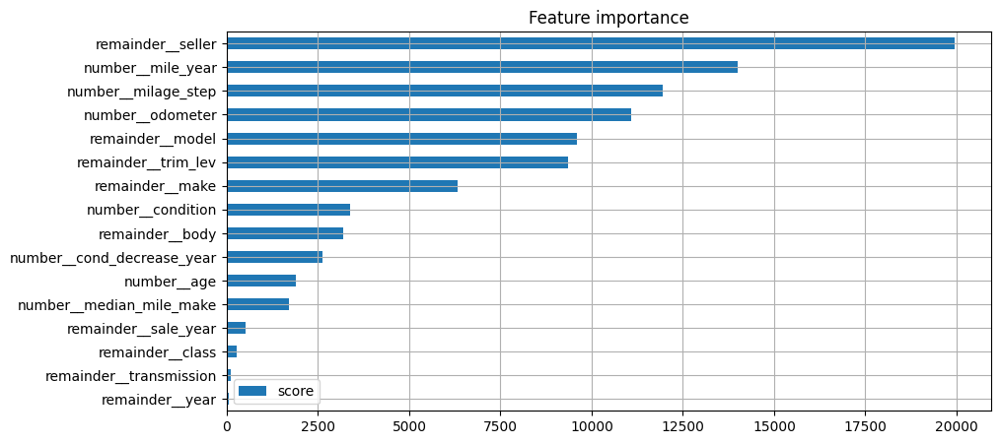

In [314]:
feature_importance.sort_values(by='score', ascending=True).plot(kind='barh', 
                                                                grid=True, 
                                                                figsize=(10,5), title='Feature importance') 
plt.show()

## CatBoostRegressor

Инициализируем модель:

In [315]:
cbr = CatBoostRegressor(grow_policy='Lossguide', 
                         verbose=500, 
                         random_state=RANDOM_STATE)

In [316]:
# params = {'iterations': [3000, 3500, 4500],
#           'num_leaves': [10, 15, 25],
#           'max_depth': [10, 15, 25],
#           'learning_rate': [0.01, .1]}

params = {'iterations': [4500],
          'num_leaves': [25],
          'max_depth': [15],
          'learning_rate': [0.1]}

SCORING = 'r2'

gs_cbr = GridSearchCV(
    cbr, params,
    # cv=skf.split(X_train, y_train),
    cv=5,
    scoring=SCORING
    # refit='roc_auc'
)

In [317]:
cat_features_cb = X_train.select_dtypes(include='object').columns.tolist()
cat_features_cb

['make', 'model', 'body', 'seller', 'transmission', 'trim_lev', 'class']

In [318]:
%%time
gs_cbr.fit(X_train, y_train, cat_features=cat_features_cb)

0:	learn: 9144.4203787	total: 147ms	remaining: 11m 1s
500:	learn: 3020.3253131	total: 34.7s	remaining: 4m 37s
1000:	learn: 2832.1142813	total: 59.8s	remaining: 3m 29s
1500:	learn: 2726.1224847	total: 1m 20s	remaining: 2m 40s
2000:	learn: 2661.5561445	total: 1m 41s	remaining: 2m 6s
2500:	learn: 2616.0705966	total: 2m 4s	remaining: 1m 39s
3000:	learn: 2579.7310797	total: 2m 24s	remaining: 1m 12s
3500:	learn: 2548.7770341	total: 2m 50s	remaining: 48.6s
4000:	learn: 2522.9398580	total: 3m 11s	remaining: 23.9s
4499:	learn: 2501.6679882	total: 3m 32s	remaining: 0us
0:	learn: 9131.8193062	total: 92.7ms	remaining: 6m 57s
500:	learn: 3080.5582418	total: 33.8s	remaining: 4m 30s
1000:	learn: 2861.9229889	total: 1m	remaining: 3m 32s
1500:	learn: 2755.9994188	total: 1m 24s	remaining: 2m 49s
2000:	learn: 2686.4621350	total: 1m 46s	remaining: 2m 12s
2500:	learn: 2635.1530786	total: 2m 6s	remaining: 1m 41s
3000:	learn: 2598.5984513	total: 2m 27s	remaining: 1m 13s
3500:	learn: 2565.3207482	total: 2m 48

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x172df9dc0>,
             param_grid={'iterations': [4500], 'learning_rate': [0.1],
                         'max_depth': [15], 'num_leaves': [25]},
             scoring='r2')

In [319]:
print(f'Лучшие параметры на CV: {gs_cbr.best_params_}\nЛучший R2 на CV: {gs_cbr.best_score_}')

Лучшие параметры на CV: {'iterations': 4500, 'learning_rate': 0.1, 'max_depth': 15, 'num_leaves': 25}
Лучший R2 на CV: 0.9216992946823057


**Анализ влияния признаков:**

In [320]:
feature_names = X_train.columns.tolist()
feature_scores = gs_cbr.best_estimator_.feature_importances_.tolist()

In [321]:
feature_importance = pd.DataFrame(data=feature_scores, columns=['score'], index=feature_names)

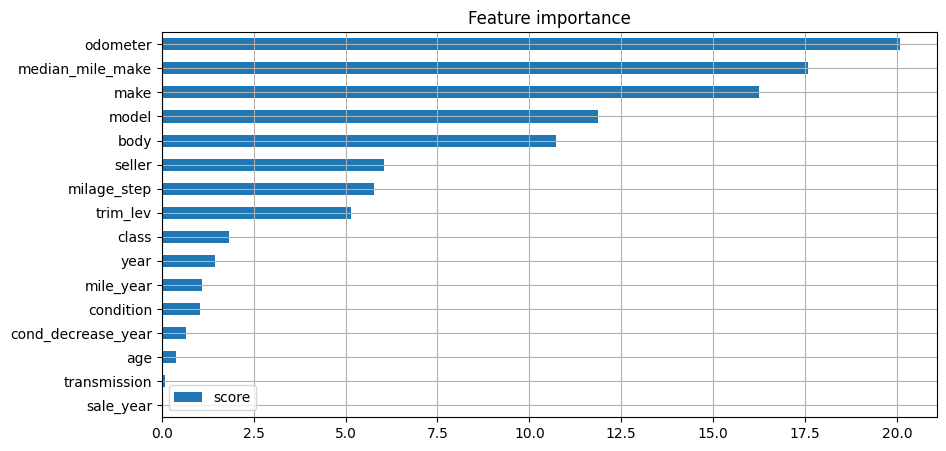

In [322]:
feature_importance.sort_values(by='score', ascending=True).plot(kind='barh', 
                                                                grid=True, 
                                                                figsize=(10,5), title='Feature importance') 
plt.show()

In [323]:
gs_cbr_res = pd.DataFrame({'model': 'CatBoost', 'R2': gs_cbr.best_score_}, index=range(1))
gs_cbr_res

,model,R2
0,CatBoost,0.921699


In [324]:
spreadsheet = spreadsheet.append(gs_cbr_res, ignore_index=True).reset_index(drop=True)
spreadsheet

,model,R2
0,LinearRegression,0.558905
1,RandomForestRegressor,0.602677
2,LGBM,0.934075
3,CatBoost,0.921699


## Предсказание на сырых данных

Обнулим все данные

In [325]:
data_row = pd.read_csv('train.csv')
test_row = pd.read_csv('test.csv')

In [326]:
data_row = data_row.fillna(-1)

In [327]:
test_row = test_row.fillna(-1)

In [328]:
X = data_row.drop(['sellingprice'], axis=1)
y = data_row.sellingprice

In [329]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=.25, 
                                                    random_state=RANDOM_STATE,
                                                    # stratify=X['class'],
                                                    shuffle=True)

print(X_train.shape, 
      y_train.shape, 
      X_test.shape, 
      y_test.shape,
      sep='\n')

(330177, 14)
(330177,)
(110059, 14)
(110059,)


### LightGBM

Обучим модель на сырых данных (без предобработки и кодирования)

In [330]:
cols = test_row.select_dtypes(include='object').columns.tolist()
cols

['make',
 'model',
 'trim',
 'body',
 'transmission',
 'vin',
 'state',
 'color',
 'interior',
 'seller',
 'saledate']

In [331]:
X_train[cols] = X_train.select_dtypes(include='object').astype('category')
X_test[cols] = X_test.select_dtypes(include='object').astype('category')

test_row[cols] = test_row.select_dtypes(include='object').astype('category')

In [332]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 330177 entries, 23470 to 121958
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   year          330177 non-null  int64   
 1   make          330177 non-null  category
 2   model         330177 non-null  category
 3   trim          330177 non-null  category
 4   body          330177 non-null  category
 5   transmission  330177 non-null  category
 6   vin           330177 non-null  category
 7   state         330177 non-null  category
 8   condition     330177 non-null  float64 
 9   odometer      330177 non-null  float64 
 10  color         330177 non-null  category
 11  interior      330177 non-null  category
 12  seller        330177 non-null  category
 13  saledate      330177 non-null  category
dtypes: category(11), float64(2), int64(1)
memory usage: 26.9 MB


In [333]:
lgbm = LGBMRegressor(random_state=RANDOM_STATE,
                     n_jobs=-1)

# пайплайн модели
# lgbm_pipe = Pipeline(steps=[
#     ('preprocess', ct_ohe),
#     ('model', lgbm)
# ])

In [334]:
# params = {'n_estimators': range(3000, 6100, 500),
#           'max_depth': [10, 25, 35],
#           'learning_rate': [0.1],
#           'num_leaves': [10, 25, 35]}

params = {'n_estimators': [4000],
          'max_depth': [25],
          'learning_rate': [0.1],
          'num_leaves': [25]}

SCORING = 'r2'

gs_lgbm = GridSearchCV(
    lgbm, params,
    # cv=skf.split(X_train, y_train),
    cv=5,
    scoring=SCORING
    # refit='neg_mean_absolute_error'
)

In [335]:
%%time
gs_lgbm.fit(X_train, y_train)

CPU times: user 28min 43s, sys: 26 s, total: 29min 9s
Wall time: 4min 8s


GridSearchCV(cv=5, estimator=LGBMRegressor(random_state=42),
             param_grid={'learning_rate': [0.1], 'max_depth': [25],
                         'n_estimators': [4000], 'num_leaves': [25]},
             scoring='r2')

In [336]:
print(f'Лучшие параметры на CV: {gs_lgbm.best_params_}\nЛучший R2 на CV: {gs_lgbm.best_score_}')

Лучшие параметры на CV: {'learning_rate': 0.1, 'max_depth': 25, 'n_estimators': 4000, 'num_leaves': 25}
Лучший R2 на CV: 0.9527026082511231


**Анализ влияния признаков:**

In [337]:
feature_names = X_train.columns.tolist()
feature_scores = gs_lgbm.best_estimator_.feature_importances_.tolist()

In [338]:
feature_importance = pd.DataFrame(data=feature_scores, columns=['score'], index=feature_names)

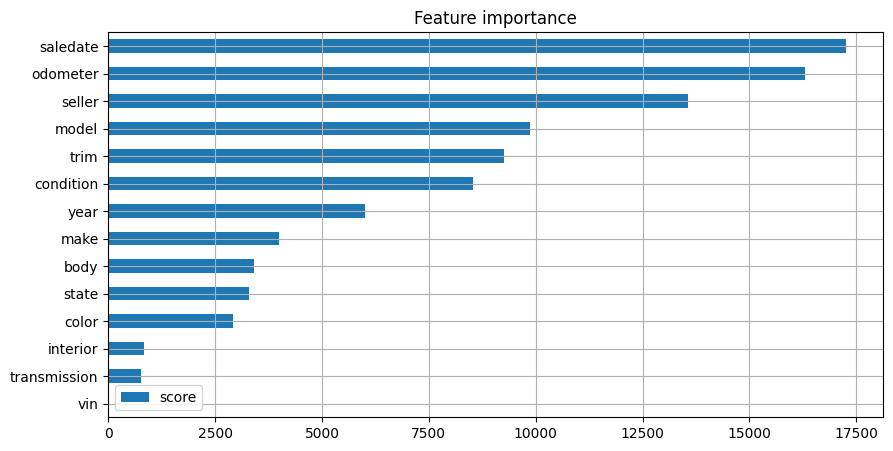

In [339]:
feature_importance.sort_values(by='score', ascending=True).plot(kind='barh', 
                                                                grid=True, 
                                                                figsize=(10,5), title='Feature importance') 
plt.show()

In [340]:
lgbm_row_res = pd.DataFrame(gs_lgbm.cv_results_)
spreadsheet_row = pd.DataFrame({'model': 'LightGBM',
                                'R2': gs_lgbm.best_score_,}, index=range(1)
                              )
spreadsheet_row

,model,R2
0,LightGBM,0.952703


**Вывод:**

Наиболее важные признаки для предсказания цены:
- `saledate` - так как оценивается косвенно возраст авто;
- `odometer` -чем меньше пробег, тем выше цена;
- `seller` - разные продавцы продают разные машины по состоянию;
- `model` - модель авто и косвенно марка;
- `trim` - комплектация;
- `condition` - состояние авто;
- `year` - год выпуска

### CatBoostRegressor

Обучим модель на сырых данных (без предобработки и кодирования)

Инициализируем модель:

In [341]:
cbr = CatBoostRegressor(grow_policy='Lossguide', 
                         verbose=500, 
                         random_state=RANDOM_STATE)

In [342]:
# params = {'iterations': [3000, 3500, 4500],
#           'num_leaves': [10, 15, 25],
#           'max_depth': [10, 15, 25],
#           'learning_rate': [0.01, .1]}

params = {'iterations': [4500],
          'max_depth': [10],
          'learning_rate': [0.1],
          'num_leaves': [25]}

SCORING = 'r2'

gs_cbr = GridSearchCV(
    cbr, params,
    # cv=skf.split(X_train, y_train),
    cv=5,
    scoring=SCORING
    # refit='roc_auc'
)

In [343]:
cat_features_cb = X_train.select_dtypes(include='category').columns.tolist()
cat_features_cb

['make',
 'model',
 'trim',
 'body',
 'transmission',
 'vin',
 'state',
 'color',
 'interior',
 'seller',
 'saledate']

In [344]:
%%time
gs_cbr.fit(X_train, y_train, cat_features=cat_features_cb)

0:	learn: 9156.3499381	total: 114ms	remaining: 8m 34s
500:	learn: 2810.8493356	total: 36.6s	remaining: 4m 52s
1000:	learn: 2537.6339086	total: 1m 6s	remaining: 3m 51s
1500:	learn: 2391.6071532	total: 1m 36s	remaining: 3m 13s
2000:	learn: 2293.4358322	total: 2m 4s	remaining: 2m 34s
2500:	learn: 2223.0713442	total: 2m 32s	remaining: 2m 1s
3000:	learn: 2152.1678111	total: 3m	remaining: 1m 29s
3500:	learn: 2091.9485050	total: 3m 27s	remaining: 59.3s
4000:	learn: 2044.5827673	total: 3m 59s	remaining: 29.9s
4499:	learn: 2002.8922282	total: 4m 27s	remaining: 0us
0:	learn: 9157.6680137	total: 127ms	remaining: 9m 31s
500:	learn: 2829.9338136	total: 38s	remaining: 5m 3s
1000:	learn: 2562.0896634	total: 1m 12s	remaining: 4m 13s
1500:	learn: 2423.9963526	total: 1m 40s	remaining: 3m 20s
2000:	learn: 2316.1993447	total: 2m 7s	remaining: 2m 39s
2500:	learn: 2240.1507242	total: 2m 34s	remaining: 2m 3s
3000:	learn: 2172.9777133	total: 3m	remaining: 1m 30s
3500:	learn: 2120.0865115	total: 3m 27s	remaini

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x1717ed3d0>,
             param_grid={'iterations': [4500], 'learning_rate': [0.1],
                         'max_depth': [10], 'num_leaves': [25]},
             scoring='r2')

In [345]:
print(f'Лучшие параметры на CV: {gs_cbr.best_params_}\nЛучший R2 на CV: {gs_cbr.best_score_}')

Лучшие параметры на CV: {'iterations': 4500, 'learning_rate': 0.1, 'max_depth': 10, 'num_leaves': 25}
Лучший R2 на CV: 0.9393864812314476


**Анализ влияния признаков:**

In [346]:
feature_names = X_train.columns.tolist()
feature_scores = gs_cbr.best_estimator_.feature_importances_.tolist()

In [347]:
feature_importance = pd.DataFrame(data=feature_scores, columns=['score'], index=feature_names)

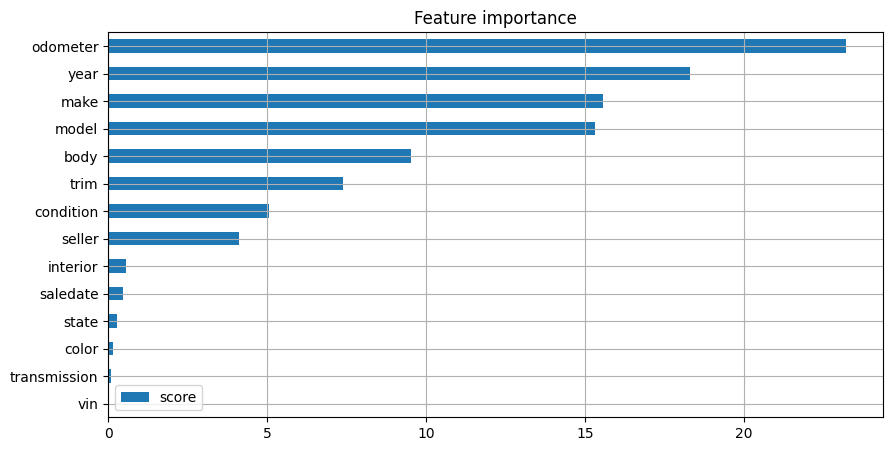

In [348]:
feature_importance.sort_values(by='score', ascending=True).plot(kind='barh', 
                                                                grid=True, 
                                                                figsize=(10,5), title='Feature importance') 
plt.show()

In [349]:
gs_cbr_res_row = pd.DataFrame({'model': 'CatBoost', 'R2': gs_cbr.best_score_}, index=range(1))
gs_cbr_res_row

,model,R2
0,CatBoost,0.939386


In [350]:
spreadsheet_row = spreadsheet_row.append(gs_cbr_res_row, ignore_index=True).reset_index(drop=True)
spreadsheet_row

,model,R2
0,LightGBM,0.952703
1,CatBoost,0.939386


## Вывод

Были рассмотрены 4 модели:
- LinearRegression;
- RandomForest;
- LightGBM;
- CatBoost.

Для моделей были подготовлены признаки двумя вариантами: 
1. признаки были предобработаны и кодированы
2. в датасете были заменены пропуски и модели обучались на "сырых" данный.

По итогам обучения моделей были получены следующие результаты:

In [351]:
spreadsheet.sort_values(by='R2', ascending=False)

,model,R2
2,LGBM,0.934075
3,CatBoost,0.921699
1,RandomForestRegressor,0.602677
0,LinearRegression,0.558905


In [352]:
spreadsheet_row.sort_values(by='R2', ascending=False)

,model,R2
0,LightGBM,0.952703
1,CatBoost,0.939386


Лучшей моделью в каждом случае оказалась `LightGBM` с параметрами на предобработанных данных:`R2 = 0.934075`; на "сырых" данных - `R2 = 0.952703`.
Наиболее важные признаки для предсказания цены:
- `saledate` - так как оценивается косвенно возраст авто;
- `odometer` -чем меньше пробег, тем выше цена;
- `seller` - разные продавцы продают разные машины по состоянию;
- `model` - модель авто и косвенно марка;
- `trim` - комплектация;
- `condition` - состояние авто;
- `year` - год выпуска

Для тестирования модели на тестовых данных используем модель `LightGBM`.

# Проверка на тестовой выборке

## Данные с предобработкой

### Подготовка признаков тестовой выборки

Разделим признаки на таргет и остальные признаки:

In [367]:
X = data.drop(['sellingprice'], axis=1)
y = data.sellingprice

In [368]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=.25, 
                                                    random_state=RANDOM_STATE,
                                                    # stratify=X['class'],
                                                    shuffle=True)

print(X_train.shape, 
      y_train.shape, 
      X_test.shape, 
      y_test.shape,
      sep='\n')

(330177, 16)
(330177,)
(110059, 16)
(110059,)


Выборки разбиты корректно. 

In [370]:
ct_ohe.fit(X_train)
X_train_ohe = ct_ohe.transform(X_train)
X_test_ohe = ct_ohe.transform(X_test)
test_ohe = ct_ohe.transform(test)

In [371]:
cols = X_train_ohe.select_dtypes(include='object').columns.tolist()
cols

['remainder__make',
 'remainder__model',
 'remainder__body',
 'remainder__seller',
 'remainder__transmission',
 'remainder__trim_lev',
 'remainder__class']

In [372]:
X_train_ohe[cols] = X_train_ohe.select_dtypes(include='object').astype('category')
X_test_ohe[cols] = X_test_ohe.select_dtypes(include='object').astype('category')

test_ohe[cols] = test.select_dtypes(include='object').astype('category')

### Расчет предсказанных значений

In [373]:
lgbm = LGBMRegressor(learning_rate=0.1, 
                     max_depth=10,
                     n_estimators=4000,
                     num_leaves=25,
                     random_state=RANDOM_STATE,
                     n_jobs=-1)

In [374]:
lgbm.fit(X_train_ohe, y_train)

LGBMRegressor(max_depth=10, n_estimators=4000, num_leaves=25, random_state=42)

In [376]:
prediction = lgbm.predict(test_ohe)

In [380]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110058 entries, 0 to 110057
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   year                110058 non-null  int64  
 1   make                110058 non-null  object 
 2   model               110058 non-null  object 
 3   body                110058 non-null  object 
 4   seller              110058 non-null  object 
 5   transmission        110058 non-null  object 
 6   condition           110058 non-null  float64
 7   odometer            110058 non-null  float64
 8   trim_lev            110058 non-null  object 
 9   sale_year           110058 non-null  int64  
 10  age                 110058 non-null  int64  
 11  mile_year           110058 non-null  float64
 12  median_mile_make    110058 non-null  float64
 13  cond_decrease_year  110058 non-null  float64
 14  milage_step         110058 non-null  float64
 15  class               110058 non-nul

In [382]:
answers = pd.DataFrame(data={'vin': VIN['vin'],
                             'sellingprice': prediction})

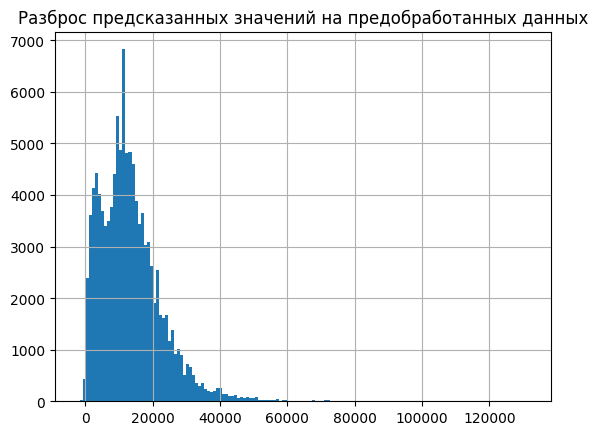

In [389]:
answers['sellingprice'].hist(bins=150)

plt.title('Разброс предсказанных значений на предобработанных данных')
plt.show()

In [400]:
# выгрузка ответов
# answers.to_csv('answers_lgbm.csv', index=False)

In [391]:
answers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110058 entries, 0 to 110057
Data columns (total 2 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   vin           110058 non-null  object 
 1   sellingprice  110058 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.5+ MB


## На сырых данных

### Подготовка признаков тестовой выборки

In [393]:
data_row = pd.read_csv('train.csv')
test_row = pd.read_csv('test.csv')

In [394]:
data_row = data_row.fillna(-1)

In [395]:
test_row = test_row.fillna(-1)

In [396]:
X = data_row.drop(['sellingprice'], axis=1)
y = data_row.sellingprice

In [397]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=.25, 
                                                    random_state=RANDOM_STATE,
                                                    # stratify=X['class'],
                                                    shuffle=True)

print(X_train.shape, 
      y_train.shape, 
      X_test.shape, 
      y_test.shape,
      sep='\n')

(330177, 14)
(330177,)
(110059, 14)
(110059,)


In [398]:
cols = test_row.select_dtypes(include='object').columns.tolist()
cols

['make',
 'model',
 'trim',
 'body',
 'transmission',
 'vin',
 'state',
 'color',
 'interior',
 'seller',
 'saledate']

In [399]:
X_train[cols] = X_train.select_dtypes(include='object').astype('category')
X_test[cols] = X_test.select_dtypes(include='object').astype('category')

test_row[cols] = test_row.select_dtypes(include='object').astype('category')

### Расчет предсказанных значений

In [401]:
lgbm = LGBMRegressor(learning_rate=0.1, 
                     max_depth=25,
                     n_estimators=4000,
                     num_leaves=25,
                     random_state=RANDOM_STATE,
                     n_jobs=-1)

In [402]:
lgbm.fit(X_train, y_train)

LGBMRegressor(max_depth=25, n_estimators=4000, num_leaves=25, random_state=42)

In [403]:
prediction = lgbm.predict(test_row)

In [404]:
answers_row = pd.DataFrame(data={'vin': VIN['vin'],
                             'sellingprice': prediction})

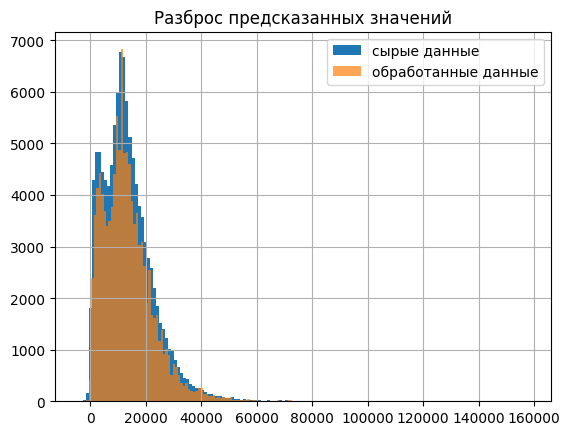

In [412]:
answers_row['sellingprice'].hist(bins=150, label='сырые данные')
answers['sellingprice'].hist(bins=150, alpha=.7, label='обработанные данные')

plt.title('Разброс предсказанных значений')
plt.legend()
plt.show()

In [406]:
# выгрузка ответов
# answers.to_csv('answers_row_lgbm.csv', index=False)

In [407]:
answers_row.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110058 entries, 0 to 110057
Data columns (total 2 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   vin           110058 non-null  object 
 1   sellingprice  110058 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.5+ MB


# Вывод

**1.** Всего в данных содержалось `440236` строк и 14 признаков, не считая таргета. В данных (обучающих и тестовых) находились дубликаты (одинаковый `vin`)

**2.** Была проведена предобработка данных как обучающих, так и тестовых, в составе:
- устранены пропуски в признаках:
    - `make`
    - `model`
    - `trim` 
    - `body` 
    - `transmission`
    - `condition`
    - `odometer`
    - `color`
    - `interior`
- выявлены и удалены явные дубликаты в признаке `vin`
- выявлены и устранены невные дубликаты в признаках:
    - `make`
    - `body`
    - `color`
    - `interior`
    - `trim`
    - `seller`
- были сгенерированы новые признаки:
    - год, месяц и день продажи авто
    - возраст авто на момент продажи
    - среднегодовой пробег
    - медианный пробег заданной модели авто в год выпуска
    - среднегодовое снижение состояния авто
    - средний пробег, снижающий состояние авто на 0.01 пункт
    - класс авто
 
**3.** Были сгенерированы полиномиальные признаки, но в ходе обучения моделей и исследования важности признаков, полиномиальные признаки не дали никакого прироста к метрикам. Принято решение не генерировать их.

**4.** Был проведен EDA и сделаны вывод по анализу.

**5.** Для предсказания `sellingprice` были рассмотрены 4 модели:
- LinearRegression;
- RandomForest;
- LightGBM;
- CatBoost.

Для моделей были подготовлены признаки двумя вариантами: 
1. признаки были предобработаны и кодированы
2. в датасете были заменены пропуски и модели обучались на "сырых" данный.

По итогам обучения моделей были получены следующие результаты:

In [353]:
spreadsheet.sort_values(by='R2', ascending=False)

,model,R2
2,LGBM,0.934075
3,CatBoost,0.921699
1,RandomForestRegressor,0.602677
0,LinearRegression,0.558905


In [354]:
spreadsheet_row.sort_values(by='R2', ascending=False)

,model,R2
0,LightGBM,0.952703
1,CatBoost,0.939386


Лучшей моделью в каждом случае оказалась `LightGBM` с параметрами на предобработанных данных:`R2 = 0.934075`; на "сырых" данных - `R2 = 0.952703`.
Наиболее важные признаки для предсказания цены:
- `saledate` - так как оценивается косвенно возраст авто;
- `odometer` -чем меньше пробег, тем выше цена;
- `seller` - разные продавцы продают разные машины по состоянию;
- `model` - модель авто и косвенно марка;
- `trim` - комплектация;
- `condition` - состояние авто;
- `year` - год выпуска

Для тестирования модели на тестовых данных использовали модель `LightGBM`.